In [2]:
import pandas as pd
pd.set_option('display.expand_frame_repr', False)

import matplotlib
import matplotlib.pyplot as plt
font = {'size' : 20}
matplotlib.rc('font', **font)

import seaborn as sns

from pylab import rcParams
rcParams["figure.figsize"] = 30,16

import sklearn
from sklearn import metrics

import numpy as np
import scipy

import datetime as dt
from datetime import date

from collections import OrderedDict

from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

import warnings
warnings.filterwarnings("ignore")

import sys
sys.path.insert(0, "../")
import functions

# <font size="7">Vergleich der Temperaturwerte</font>

## <font size="6">Tiefsttemperatur</font><a class="anchor" id="2-02a-tiefst"></a>

In [5]:
#Daten aus jeweiliger CSV-Datei laden
df_tiefst = pd.read_csv("Datenbeschaffung/kalender.csv", index_col=0, parse_dates=True, usecols=[0,2])
df_tiefst = df_tiefst.join(pd.read_csv("Datenbeschaffung/stuttgart.csv", index_col=0, parse_dates=True, usecols=[0,7], squeeze=True).rename("stuttgart"))
df_tiefst = df_tiefst.join(pd.read_csv("Datenbeschaffung/freiburg.csv", index_col=0, parse_dates=True, usecols=[0,7], squeeze=True).rename("freiburg"))
df_tiefst = df_tiefst.join(pd.read_csv("Datenbeschaffung/mannheim.csv", index_col=0, parse_dates=True, usecols=[0,7], squeeze=True).rename("mannheim"))
df_tiefst = df_tiefst.join(pd.read_csv("Datenbeschaffung/ulm.csv", index_col=0, parse_dates=True, usecols=[0,7], squeeze=True).rename("ulm"))

#Durchschnitt berechnen
df_tiefst["durchschnitt"] = round(((df_tiefst["stuttgart"] + df_tiefst["freiburg"] + df_tiefst["mannheim"] + df_tiefst["ulm"]) / 4), 1)

print(df_tiefst)

             wochentag  stuttgart  freiburg  mannheim  ulm  durchschnitt
datum                                                                   
2015-01-01  Donnerstag       -4.6      -6.3      -3.9 -8.2          -5.8
2015-01-02     Freitag       -2.9      -5.6      -3.1 -4.6          -4.0
2015-01-03     Samstag       -2.0      -6.2      -0.4 -3.8          -3.1
2015-01-04     Sonntag       -3.5      -5.0      -0.8 -4.7          -3.5
2015-01-05      Montag       -2.8      -5.2      -2.4 -5.5          -4.0
...                ...        ...       ...       ...  ...           ...
2021-12-27      Montag        4.2       4.1       4.5  1.8           3.6
2021-12-28    Dienstag        5.6       6.9       7.1  2.4           5.5
2021-12-29    Mittwoch        6.7       7.4       7.9  5.3           6.8
2021-12-30  Donnerstag       10.2       9.8      10.5  8.5           9.8
2021-12-31     Freitag        7.6       6.8       9.0  6.5           7.5

[2557 rows x 6 columns]


<font size="5">Der Verlauf der Tagestiefsttemperatur ist in allen Städten sehr ähnlich. In den Liniendiagrammen der einzelnen Jahre ist zu erkennen, dass sowohl die generelle Aufwärts- und Abwärtsbewegung sowie die feineren Ausschläge nach oben und unten fast gleich verlaufen.</font>

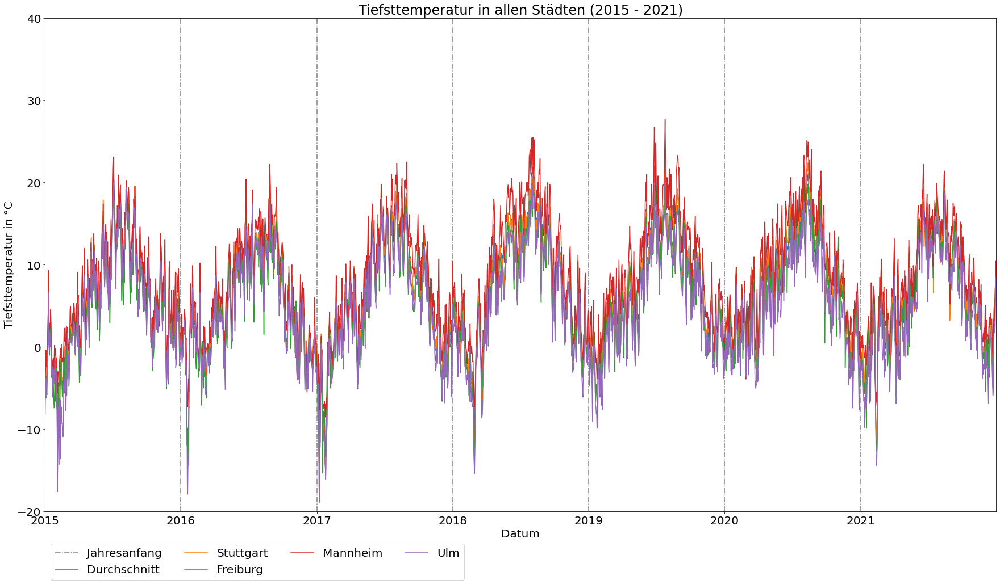



               count      mean       std   min  25%  50%   75%   max
stuttgart     2557.0  6.662652  6.365525 -14.7  1.8  6.4  11.6  22.4
freiburg      2557.0  5.614470  6.326806 -15.3  0.8  5.6  10.5  21.9
mannheim      2557.0  8.533594  6.615816 -10.0  3.2  8.2  13.7  27.7
ulm           2557.0  4.825303  6.484583 -18.9  0.0  4.6  10.0  20.5
durchschnitt  2557.0  6.409073  6.370920 -13.9  1.4  6.2  11.5  22.5




In [6]:
#Jahre einzeichnen
functions.draw_years(df_tiefst)

#Daten für jede Stadt und Durchschnitt plotten
plt.plot(df_tiefst["durchschnitt"], label="Durchschnitt")
plt.plot(df_tiefst["stuttgart"], label="Stuttgart");
plt.plot(df_tiefst["freiburg"], label="Freiburg");
plt.plot(df_tiefst["mannheim"], label="Mannheim");
plt.plot(df_tiefst["ulm"], label="Ulm");

#Achsen und Layout
plt.title("Tiefsttemperatur in allen Städten (2015 - 2021)")
plt.ylabel("Tiefsttemperatur in °C")
plt.ylim(-20, 40)
plt.xlabel("Datum")
plt.xlim(dt.datetime(2015,1,1), dt.datetime(2021,12,31))

#Legende einfügen
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc="lower left", bbox_to_anchor=(0,-0.15), ncol=4)

plt.show()

#Deskriptive Statistiken
print("\n")
print(df_tiefst.describe().transpose())
print("\n")



 2015 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




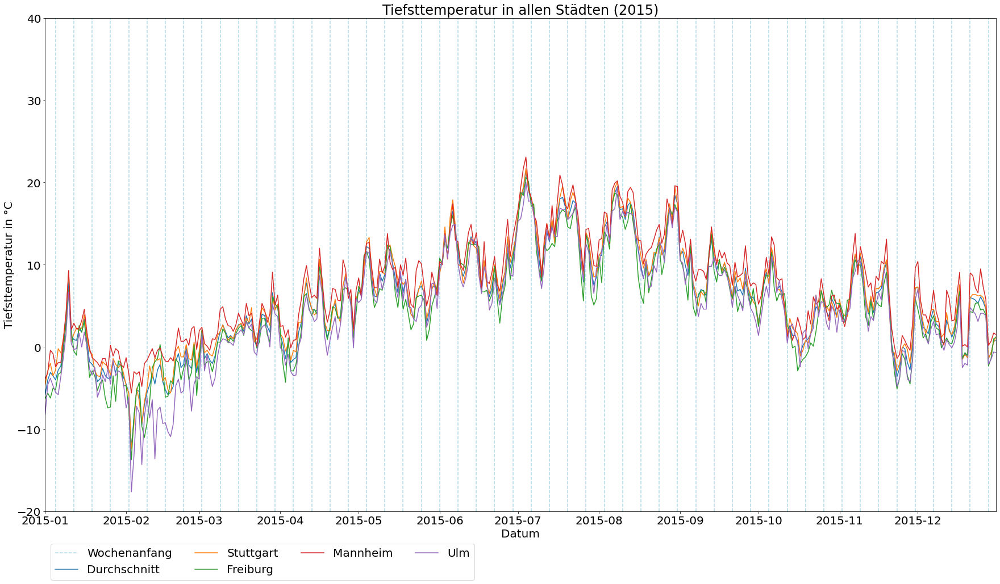



              count      mean       std   min  25%  50%   75%   max
stuttgart     365.0  5.959452  6.180988 -12.4  1.4  6.0  10.1  21.7
freiburg      365.0  4.823288  6.341502 -13.7  0.5  5.0   8.9  20.6
mannheim      365.0  7.173973  5.973661  -5.6  2.3  7.2  11.0  23.1
ulm           365.0  4.459452  6.725309 -17.6  0.0  4.6   9.0  20.0
durchschnitt  365.0  5.604110  6.231333 -12.3  1.0  5.8   9.9  21.4




 2016 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




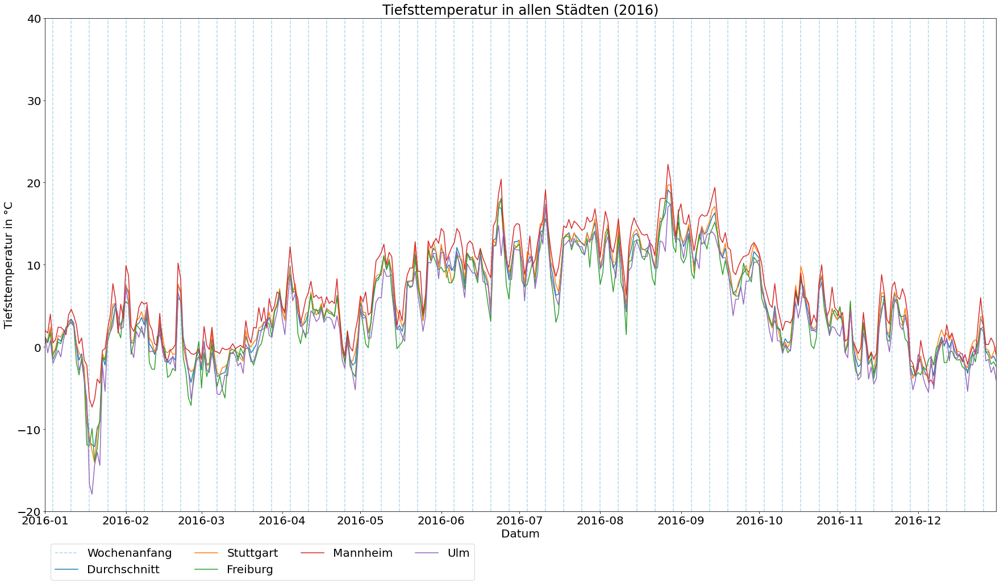



              count      mean       std   min    25%   50%     75%   max
stuttgart     366.0  5.440984  5.953699 -14.1  0.625  4.60  10.575  19.7
freiburg      366.0  4.407923  5.909840 -13.9 -0.200  4.05   9.075  18.1
mannheim      366.0  6.736066  6.047212  -7.3  1.700  6.00  12.100  22.2
ulm           366.0  4.193989  6.027355 -17.9 -0.475  3.55   9.500  17.4
durchschnitt  366.0  5.193716  5.916023 -12.1  0.400  4.40  10.175  19.1




 2017 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




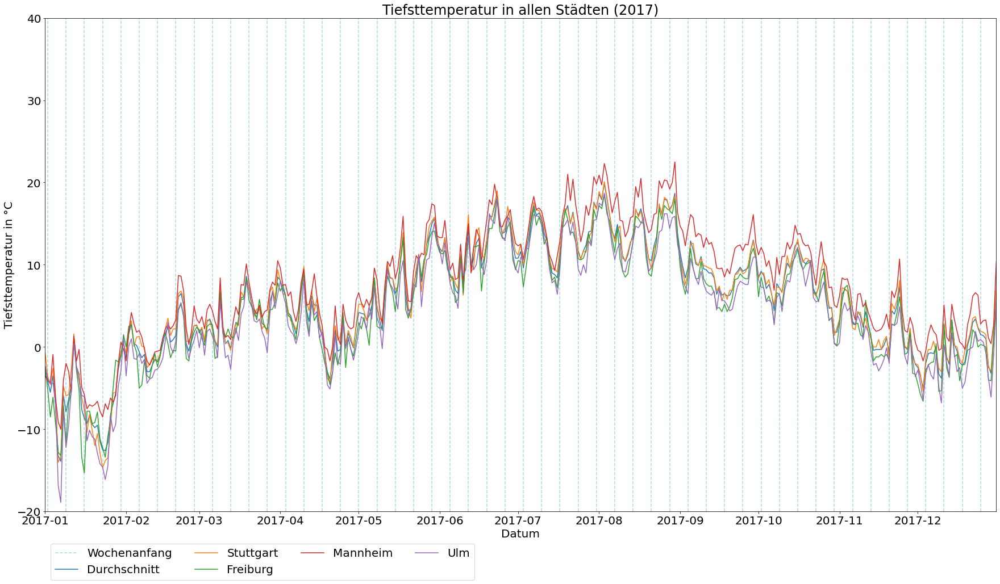



              count      mean       std   min  25%  50%   75%   max
stuttgart     365.0  5.895342  6.842988 -14.7  1.3  6.4  10.8  20.1
freiburg      365.0  4.836438  6.828501 -15.3  0.2  4.9  10.2  18.5
mannheim      365.0  7.741096  6.924380 -10.0  2.6  7.9  12.8  22.5
ulm           365.0  4.362740  6.971570 -18.9 -0.2  4.6   9.5  18.7
durchschnitt  365.0  5.708767  6.829773 -13.9  0.9  6.2  10.8  19.9




 2018 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




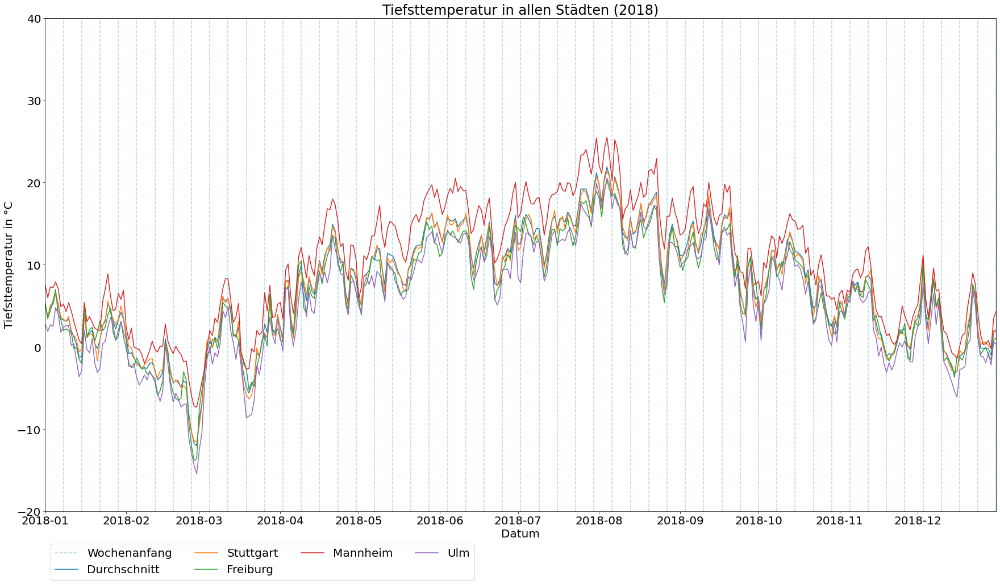



              count       mean       std   min  25%   50%   75%   max
stuttgart     365.0   7.325205  6.726520 -11.5  1.7   7.9  12.7  21.4
freiburg      365.0   6.582466  6.453619 -13.8  1.7   7.0  11.8  20.3
mannheim      365.0  10.146301  7.291216  -7.3  4.1  10.3  16.3  25.5
ulm           365.0   5.697260  6.875793 -15.4  0.5   6.4  11.3  20.5
durchschnitt  365.0   7.438082  6.791325 -12.0  2.1   7.9  12.9  21.9




 2019 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




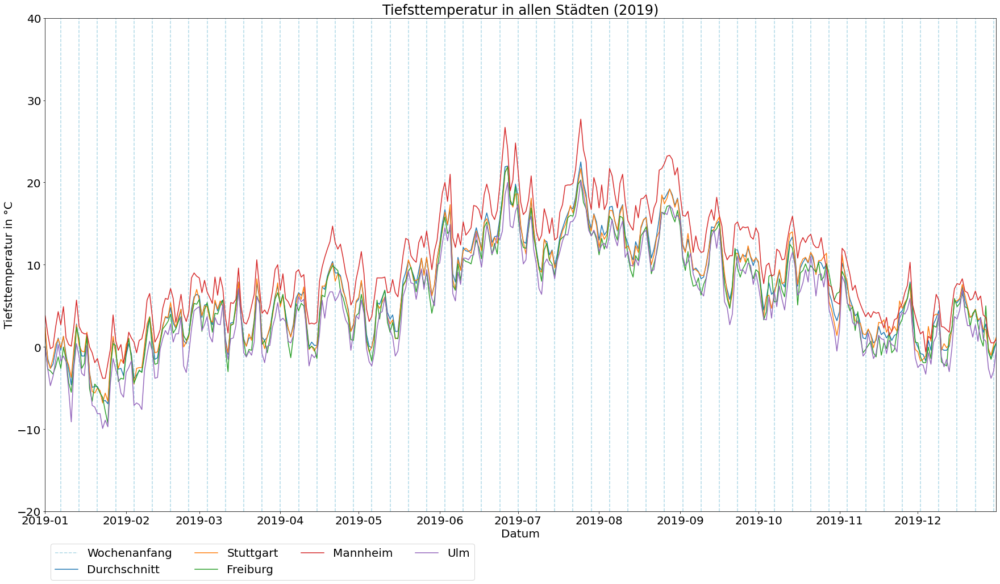



              count      mean       std  min  25%  50%   75%   max
stuttgart     365.0  6.919726  6.061946 -6.8  2.2  6.1  11.5  21.9
freiburg      365.0  6.104932  6.051598 -9.3  1.1  5.8  10.3  21.9
mannheim      365.0  9.835068  6.588137 -3.8  4.5  9.0  14.7  27.7
ulm           365.0  5.153699  6.274203 -9.9  0.3  4.6  10.0  20.2
durchschnitt  365.0  7.005479  6.189221 -6.9  1.9  6.4  11.8  22.5




 2020 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




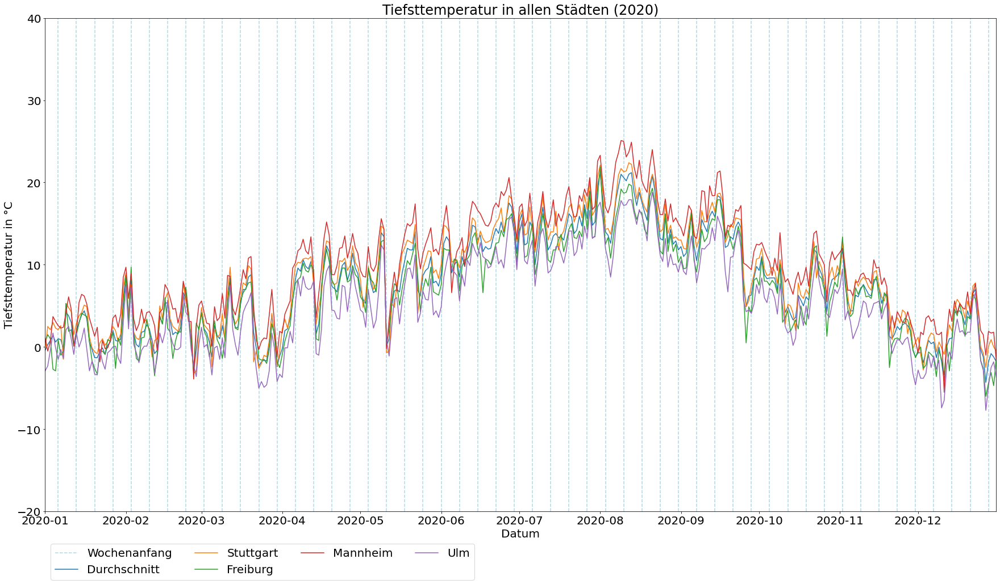



              count      mean       std  min    25%   50%     75%   max
stuttgart     366.0  8.456831  6.150113 -3.2  3.025  8.25  13.500  22.4
freiburg      366.0  6.918852  5.876519 -6.0  1.900  7.20  11.525  21.9
mannheim      366.0  9.966120  6.386364 -5.5  4.300  9.70  15.100  25.1
ulm           366.0  5.454098  5.862219 -7.7  0.325  5.25  10.100  18.8
durchschnitt  366.0  7.698087  5.987551 -4.3  2.400  7.50  12.475  21.2




 2021 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




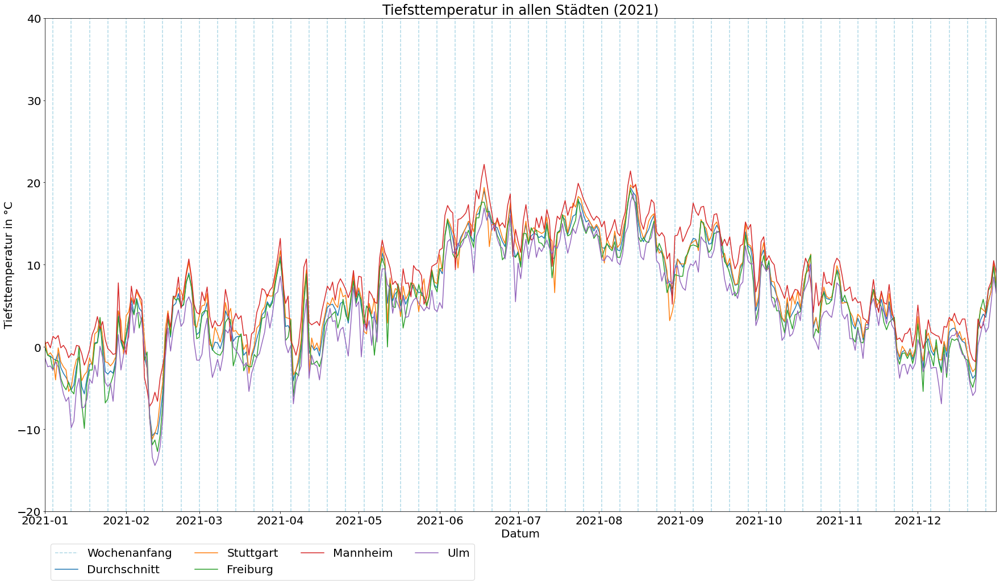



              count      mean       std   min  25%  50%   75%   max
stuttgart     365.0  6.639452  6.140290 -11.2  2.2  6.1  12.1  19.8
freiburg      365.0  5.627123  6.381559 -12.7  0.9  5.3  11.1  19.1
mannheim      365.0  8.137534  6.109144  -7.2  3.3  7.5  13.5  22.2
ulm           365.0  4.455890  6.461802 -14.4 -0.7  4.2  10.1  18.7
durchschnitt  365.0  6.215068  6.189522 -10.8  1.3  5.5  11.8  19.4




In [7]:
for year in [2015, 2016, 2017, 2018, 2019, 2020, 2021]:
    
    print("\n\n", str(year), "--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------\n\n")
    
    #Untere und obere Grenze zum Filtern des DataFrames nach jeweiligem Jahr
    lower_border = str(year) + "-01-01"
    upper_border = str(year) + "-12-31"
    
    #Wochen einzeichnen
    functions.draw_weeks(df_tiefst[lower_border:upper_border])
    
    #Daten für jede Stadt und Durchschnitt plotten
    plt.plot(df_tiefst[lower_border:upper_border]["durchschnitt"], label="Durchschnitt")
    plt.plot(df_tiefst[lower_border:upper_border]["stuttgart"], label="Stuttgart");
    plt.plot(df_tiefst[lower_border:upper_border]["freiburg"], label="Freiburg");
    plt.plot(df_tiefst[lower_border:upper_border]["mannheim"], label="Mannheim");
    plt.plot(df_tiefst[lower_border:upper_border]["ulm"], label="Ulm");
    
    #Achsen und Layout
    plt.title("Tiefsttemperatur in allen Städten (" + str(year) + ")")
    plt.ylabel("Tiefsttemperatur in °C")
    plt.ylim(-20, 40)
    plt.xlabel("Datum")
    plt.xlim(dt.datetime(year,1,1), dt.datetime(year,12,31))
    
    #Legende einfügen
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = OrderedDict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), loc="lower left", bbox_to_anchor=(0,-0.15), ncol=4)

    plt.show()
    
    #Deskriptive Statistiken
    print("\n")
    print(df_tiefst[lower_border:upper_border].describe().transpose())
    print("\n")

<font size="5">Die Berechnung der Korrelation zeigt, dass die Werte fast perfekt untereinander sowie mit dem Durchschnitt korrelieren. Aus diesem Grund wird fortan nur der einfache Durchschnitt über alle Städte verwendet.</font>

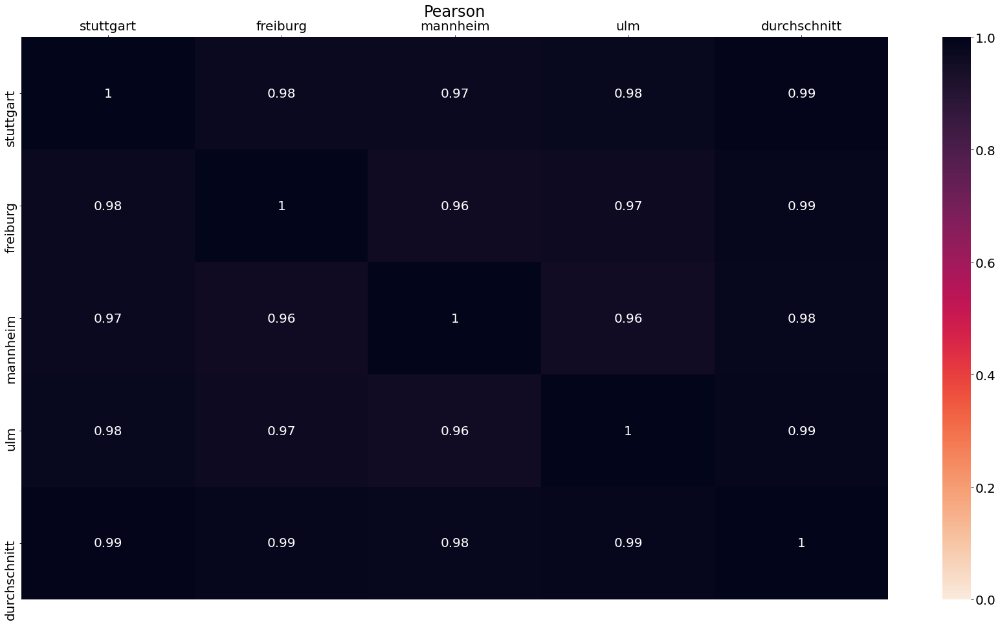

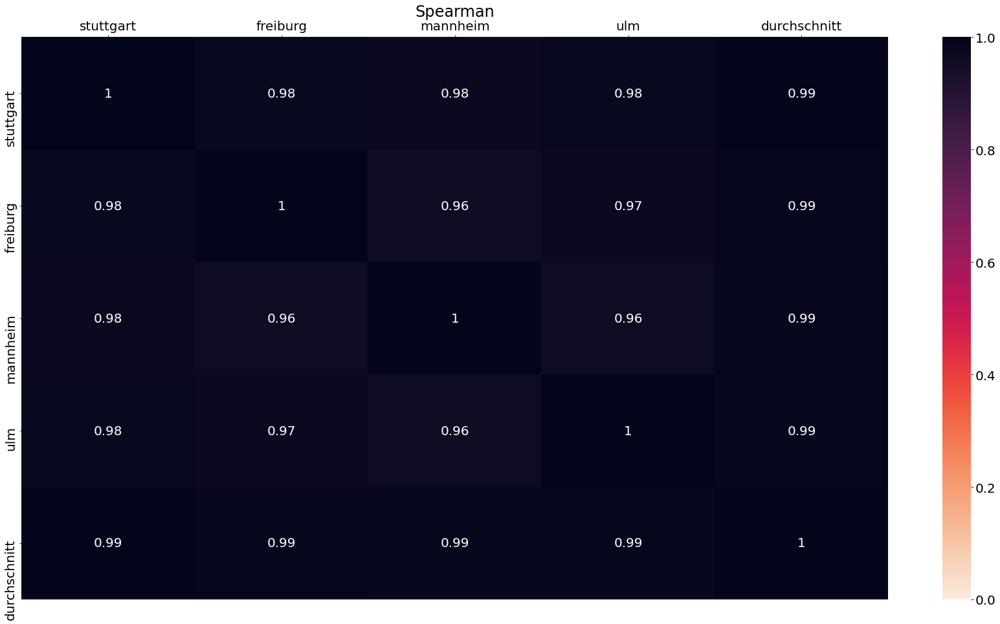

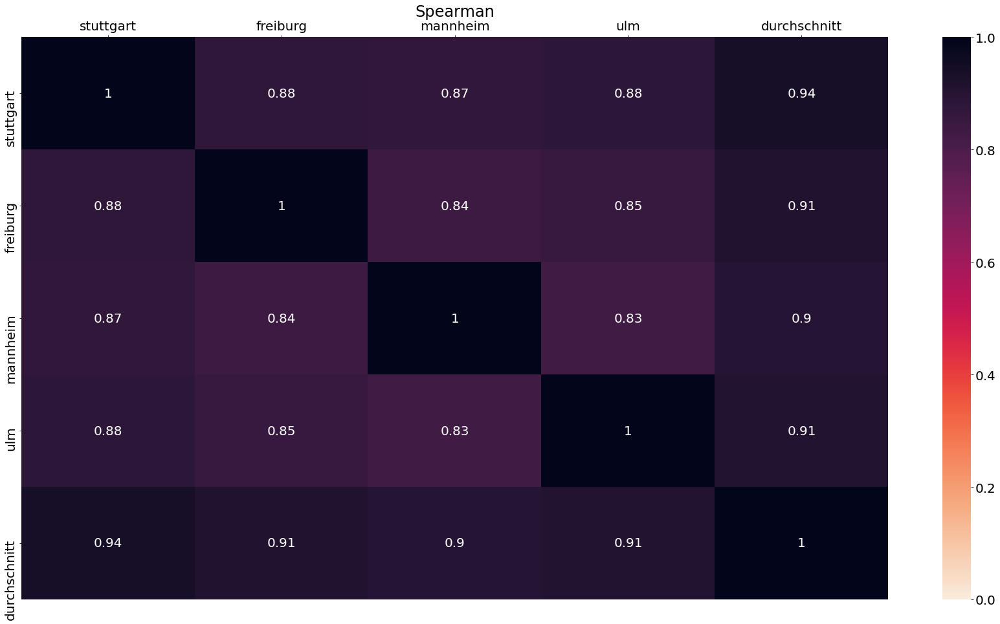

In [5]:
#Heatmap der Korrelationen untereinander (Pearson)
ax = sns.heatmap(data=df_tiefst.corr(method="pearson"), annot=True, vmin=0, vmax=1, cmap="rocket_r");
ax.set_title("Pearson")
ax.xaxis.set_ticks_position("top")

plt.show()

#Heatmap der Korrelationen untereinander (Spearman)
ax = sns.heatmap(data=df_tiefst.corr(method="spearman"), annot=True, vmin=0, vmax=1, cmap="rocket_r");
ax.set_title("Spearman")
ax.xaxis.set_ticks_position("top")

plt.show()

#Heatmap der Korrelationen untereinander (Kendall)
ax = sns.heatmap(data=df_tiefst.corr(method="kendall"), annot=True, vmin=0, vmax=1, cmap="rocket_r");
ax.set_title("Kendall")
ax.xaxis.set_ticks_position("top")

plt.show()

## <font size="6">Höchsttemperatur</font><a class="anchor" id="2-02a-hoechst"></a>

In [6]:
#Daten aus jeweiliger CSV-Datei laden
df_hoechst = pd.read_csv("Datenbeschaffung/kalender.csv", index_col=0, parse_dates=True, usecols=[0,2])
df_hoechst = df_hoechst.join(pd.read_csv("Datenbeschaffung/stuttgart.csv", index_col=0, parse_dates=True, usecols=[0,5], squeeze=True).rename("stuttgart"))
df_hoechst = df_hoechst.join(pd.read_csv("Datenbeschaffung/freiburg.csv", index_col=0, parse_dates=True, usecols=[0,5], squeeze=True).rename("freiburg"))
df_hoechst = df_hoechst.join(pd.read_csv("Datenbeschaffung/mannheim.csv", index_col=0, parse_dates=True, usecols=[0,5], squeeze=True).rename("mannheim"))
df_hoechst = df_hoechst.join(pd.read_csv("Datenbeschaffung/ulm.csv", index_col=0, parse_dates=True, usecols=[0,5], squeeze=True).rename("ulm"))

#Durchschnitt berechnen
df_hoechst["durchschnitt"] = round(((df_hoechst["stuttgart"] + df_hoechst["freiburg"] + df_hoechst["mannheim"] + df_hoechst["ulm"]) / 4), 1)

print(df_hoechst)

             wochentag  stuttgart  freiburg  mannheim   ulm  durchschnitt
datum                                                                    
2015-01-01  Donnerstag        1.4       2.1       2.5   0.5           1.6
2015-01-02     Freitag        2.2       0.9       1.4   1.7           1.6
2015-01-03     Samstag        3.6       3.7       2.6   2.9           3.2
2015-01-04     Sonntag        1.7       2.8       3.2   0.7           2.1
2015-01-05      Montag        4.0       4.3       4.1   1.2           3.4
...                ...        ...       ...       ...   ...           ...
2021-12-27      Montag        7.3       7.6       7.8   6.5           7.3
2021-12-28    Dienstag        9.6       9.9      10.9   8.5           9.7
2021-12-29    Mittwoch       12.0      12.0      13.2  11.2          12.1
2021-12-30  Donnerstag       12.3      12.8      14.3  11.8          12.8
2021-12-31     Freitag       14.2      14.5      14.7  13.2          14.2

[2557 rows x 6 columns]


<font size="5">Wie schon bei der Tagestiefsttemperatur ist auch der  Verlauf der Tageshöchsttemperatur in allen Städten sehr ähnlich. In den Liniendiagrammen der einzelnen Jahre ist zu erkennen, dass sowohl die generelle Aufwärts- und Abwärtsbewegung sowie die feineres Ausschläge nach oben und unten fast gleich verlaufen.</font>

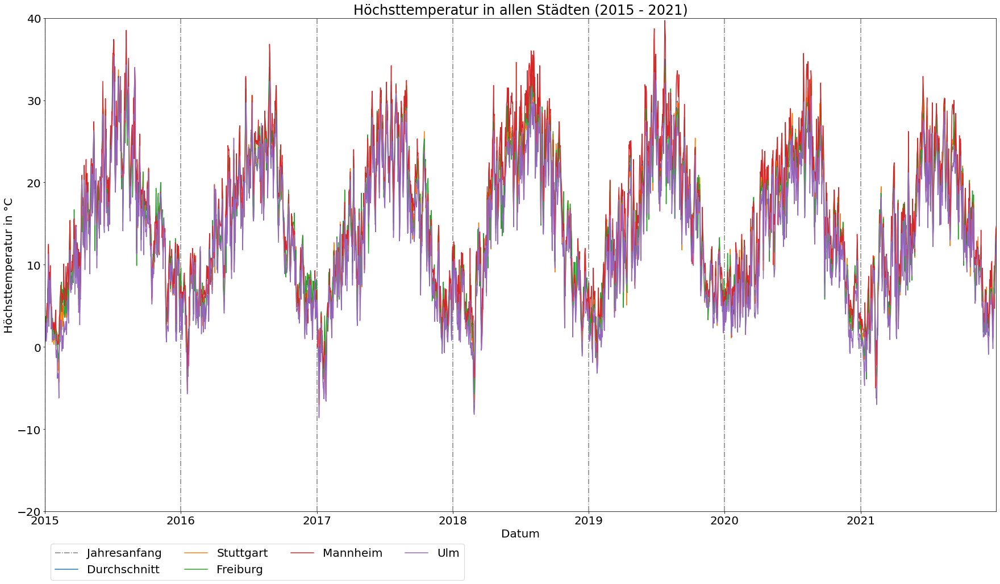



               count       mean       std  min  25%   50%   75%   max
stuttgart     2557.0  14.485491  8.389915 -7.0  7.5  14.2  21.2  36.1
freiburg      2557.0  14.858506  8.176232 -5.7  8.1  14.6  21.4  35.3
mannheim      2557.0  15.893860  8.612672 -5.0  8.7  15.4  22.7  39.7
ulm           2557.0  13.219241  8.206222 -8.6  6.5  13.1  19.8  35.3
durchschnitt  2557.0  14.614470  8.289005 -6.4  7.7  14.4  21.2  36.0




In [7]:
#Jahre einzeichnen
functions.draw_years(df_hoechst)

#Daten für jede Stadt und Durchschnitt plotten
plt.plot(df_hoechst["durchschnitt"], label="Durchschnitt")
plt.plot(df_hoechst["stuttgart"], label="Stuttgart");
plt.plot(df_hoechst["freiburg"], label="Freiburg");
plt.plot(df_hoechst["mannheim"], label="Mannheim");
plt.plot(df_hoechst["ulm"], label="Ulm");

#Achsen und Layout
plt.title("Höchsttemperatur in allen Städten (2015 - 2021)")
plt.ylabel("Höchsttemperatur in °C")
plt.ylim(-20, 40)
plt.xlabel("Datum")
plt.xlim(dt.datetime(2015,1,1), dt.datetime(2021,12,31))

#Legende einfügen
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc="lower left", bbox_to_anchor=(0,-0.15), ncol=4)

plt.show()

#Deskriptive Statistiken
print("\n")
print(df_hoechst.describe().transpose())
print("\n")



 2015 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




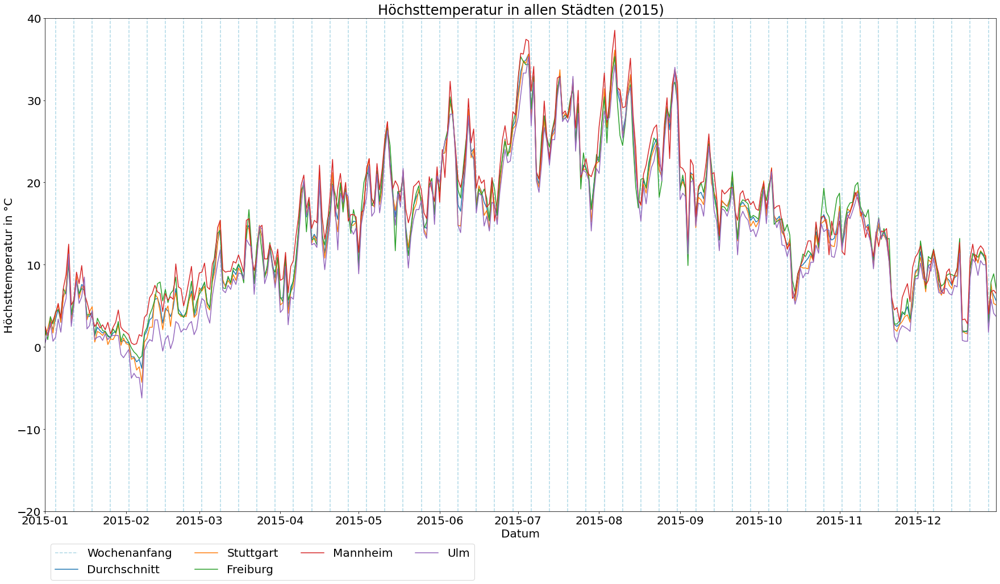



              count       mean       std  min  25%   50%   75%   max
stuttgart     365.0  14.476164  8.614781 -4.3  7.5  14.5  19.9  36.1
freiburg      365.0  14.958904  8.392858 -1.4  8.2  15.4  20.1  35.3
mannheim      365.0  15.721918  8.499128  0.3  9.2  15.4  21.1  38.5
ulm           365.0  13.604658  8.807530 -6.2  6.9  13.9  19.3  35.3
durchschnitt  365.0  14.691781  8.532365 -2.6  7.9  14.7  20.2  36.0




 2016 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




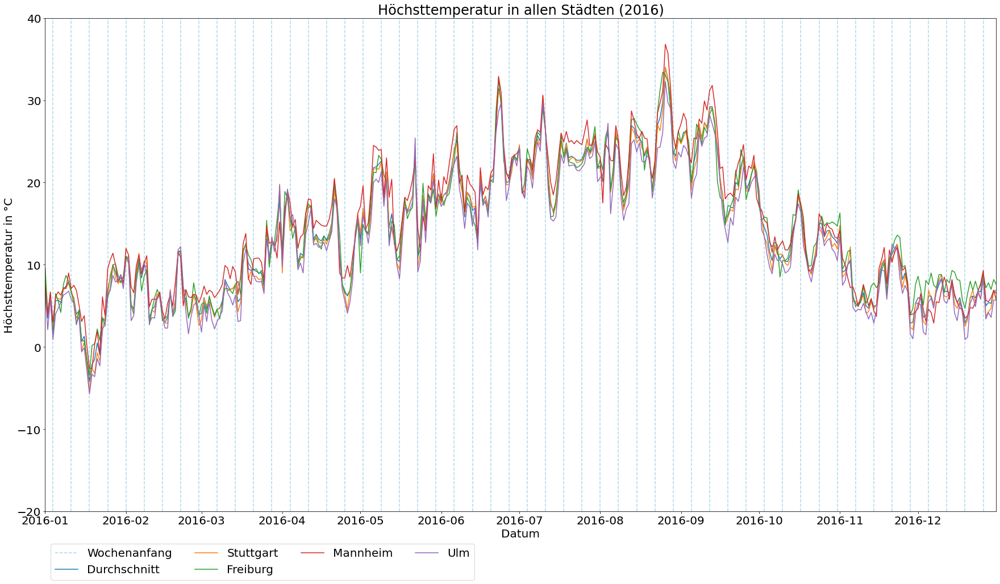



              count       mean       std  min    25%    50%     75%   max
stuttgart     366.0  13.668579  7.854469 -5.3  6.900  12.70  20.325  34.0
freiburg      366.0  14.221585  7.607559 -3.4  7.725  13.25  20.175  33.4
mannheim      366.0  14.837705  8.047676 -2.6  7.525  14.10  21.700  36.8
ulm           366.0  12.902186  7.728520 -5.7  6.225  12.30  19.475  32.3
durchschnitt  366.0  13.908470  7.752543 -4.2  6.800  13.10  20.175  34.0




 2017 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




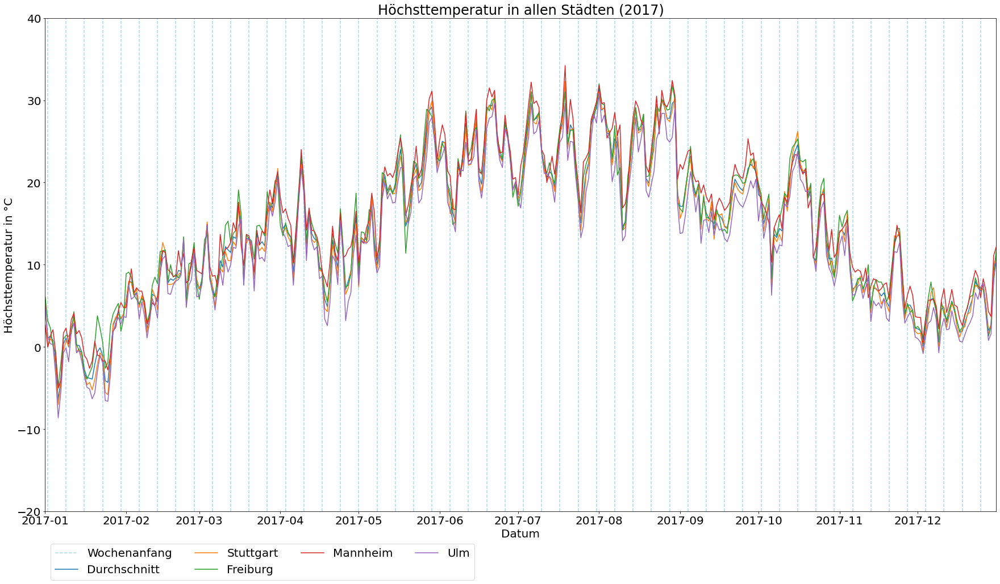



              count       mean       std  min  25%   50%   75%   max
stuttgart     365.0  14.061370  8.794580 -7.0  7.3  14.0  20.9  32.3
freiburg      365.0  14.796164  8.624858 -4.9  7.9  14.8  21.3  32.0
mannheim      365.0  15.370411  8.788542 -5.0  8.6  15.4  22.2  34.2
ulm           365.0  12.985205  8.635914 -8.6  6.2  13.1  19.9  30.8
durchschnitt  365.0  14.302466  8.664289 -6.4  7.4  14.4  21.2  31.8




 2018 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




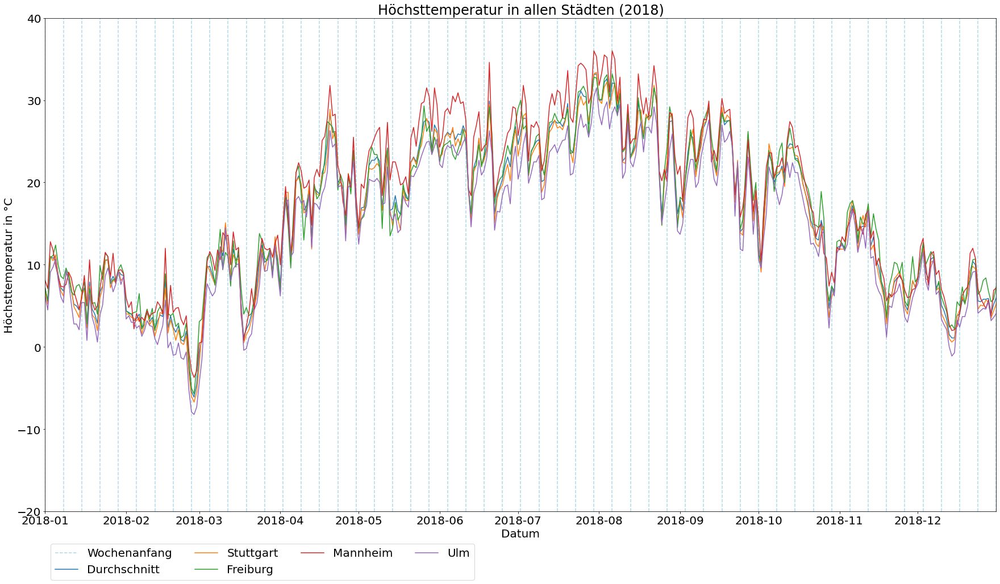



              count       mean       std  min  25%   50%   75%   max
stuttgart     365.0  15.741370  9.153848 -6.7  7.7  16.6  23.4  33.4
freiburg      365.0  16.495890  8.804039 -5.7  8.5  17.0  24.0  33.2
mannheim      365.0  17.569041  9.684302 -3.7  8.8  18.4  25.7  36.0
ulm           365.0  14.316712  8.838833 -8.2  6.7  15.4  21.9  31.5
durchschnitt  365.0  16.031233  9.068219 -6.1  7.9  16.7  23.8  33.2




 2019 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




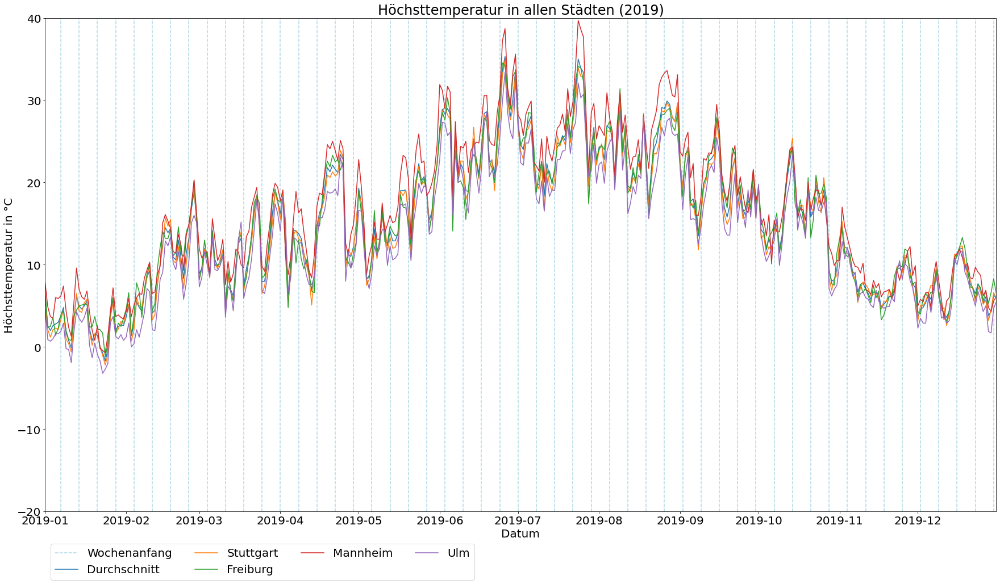



              count       mean       std  min  25%   50%   75%   max
stuttgart     365.0  14.764932  8.202075 -2.2  7.6  14.8  21.0  34.9
freiburg      365.0  15.163288  8.189364 -1.2  8.3  14.3  21.4  34.5
mannheim      365.0  16.716438  8.759852 -0.7  9.4  16.0  23.9  39.7
ulm           365.0  13.531507  8.037862 -3.2  7.0  13.3  19.8  33.4
durchschnitt  365.0  15.042740  8.238877 -1.7  8.0  14.4  21.4  35.3




 2020 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




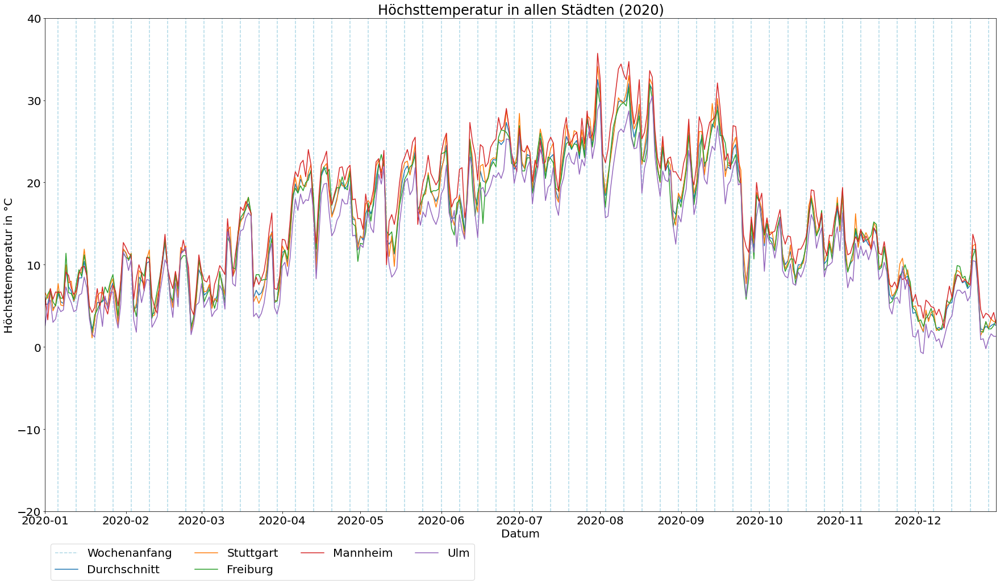



              count       mean       std  min    25%    50%     75%   max
stuttgart     366.0  15.192623  7.784134  1.1  8.625  14.80  21.900  34.1
freiburg      366.0  14.836885  7.439729  1.7  8.700  14.40  21.175  32.0
mannheim      366.0  16.231694  7.960852  2.3  8.725  15.65  22.775  35.7
ulm           366.0  13.086885  7.356074 -0.8  6.825  12.95  19.375  30.5
durchschnitt  366.0  14.836339  7.581308  1.8  8.250  14.30  21.400  32.5




 2021 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




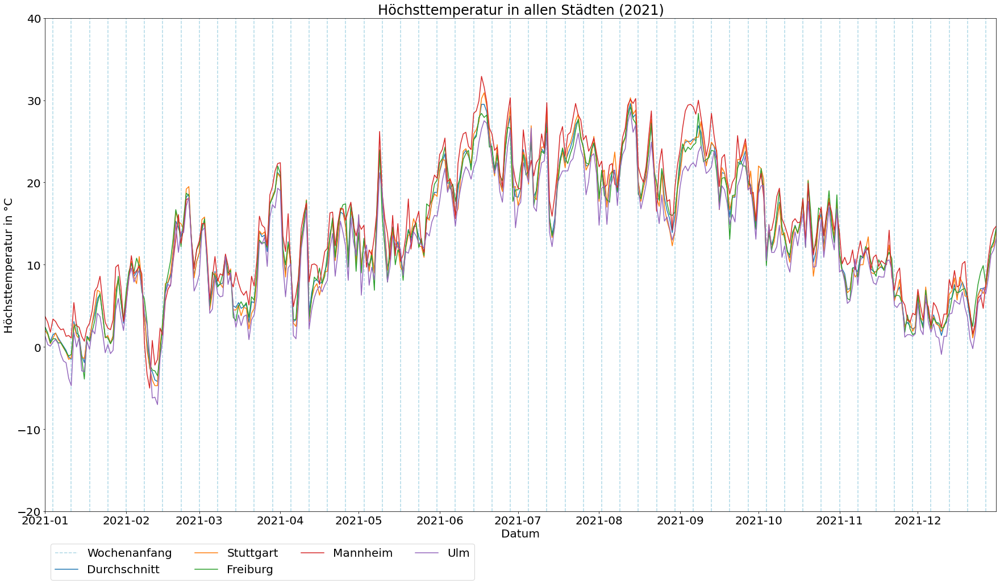



              count       mean       std  min  25%   50%   75%   max
stuttgart     365.0  13.493699  8.064359 -4.7  7.3  13.3  20.1  30.9
freiburg      365.0  13.538630  7.844310 -3.9  7.6  13.2  20.0  29.2
mannheim      365.0  14.811781  8.135301 -5.0  8.7  14.6  21.2  32.9
ulm           365.0  12.108767  7.808430 -7.0  6.1  12.2  18.8  28.6
durchschnitt  365.0  13.489589  7.903129 -4.2  7.3  13.4  19.9  29.6




In [8]:
for year in [2015, 2016, 2017, 2018, 2019, 2020, 2021]:
    
    print("\n\n", str(year), "--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------\n\n")
    
    #Untere und obere Grenze zum Filtern des DataFrames nach jeweiligem Jahr
    lower_border = str(year) + "-01-01"
    upper_border = str(year) + "-12-31"
    
    #Wochen einzeichnen
    functions.draw_weeks(df_hoechst[lower_border:upper_border])
    
    #Daten für jede Stadt und Durchschnitt plotten
    plt.plot(df_hoechst[lower_border:upper_border]["durchschnitt"], label="Durchschnitt")
    plt.plot(df_hoechst[lower_border:upper_border]["stuttgart"], label="Stuttgart");
    plt.plot(df_hoechst[lower_border:upper_border]["freiburg"], label="Freiburg");
    plt.plot(df_hoechst[lower_border:upper_border]["mannheim"], label="Mannheim");
    plt.plot(df_hoechst[lower_border:upper_border]["ulm"], label="Ulm");
    
    #Achsen und Layout
    plt.title("Höchsttemperatur in allen Städten (" + str(year) + ")")
    plt.ylabel("Höchsttemperatur in °C")
    plt.ylim(-20, 40)
    plt.xlabel("Datum")
    plt.xlim(dt.datetime(year,1,1), dt.datetime(year,12,31))
    
    #Legende einfügen
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = OrderedDict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), loc="lower left", bbox_to_anchor=(0,-0.15), ncol=4)

    plt.show()
    
    #Deskriptive Statistiken
    print("\n")
    print(df_hoechst[lower_border:upper_border].describe().transpose())
    print("\n")

<font size="5">Die Berechnung der Korrelation zeigt auch hier, dass die Werte fast perfekt untereinander sowie mit dem Durchschnitt korrelieren. Aus diesem Grund wird fortan nur der einfache Durchschnitt über alle Städte verwendet.</font>

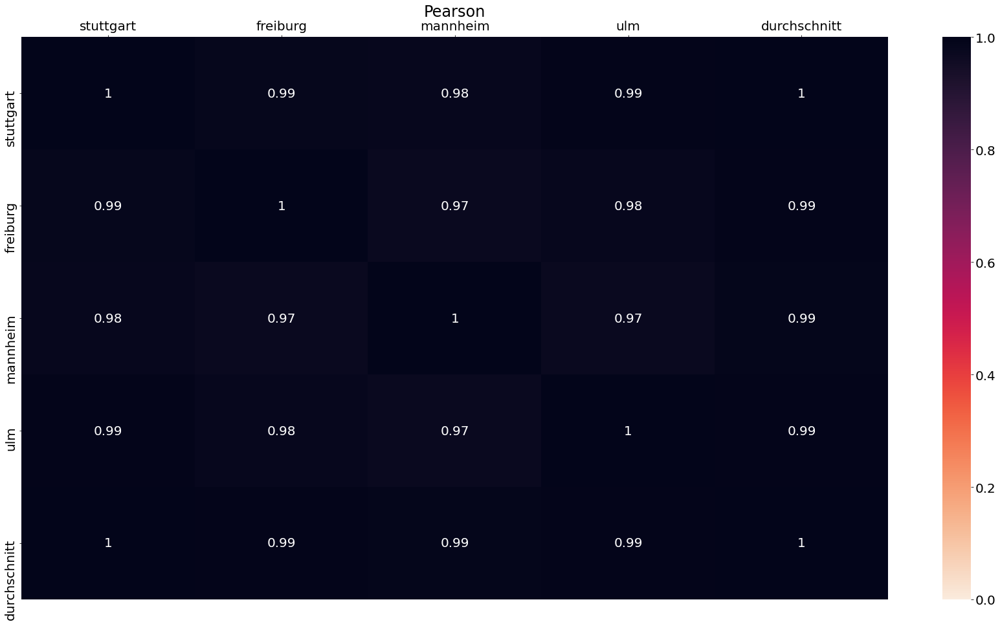

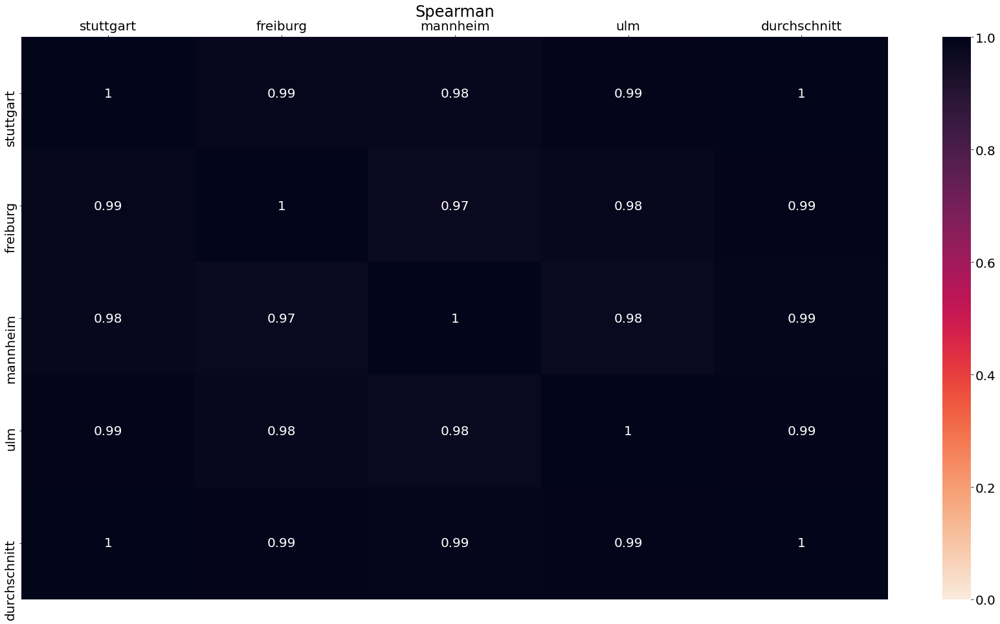

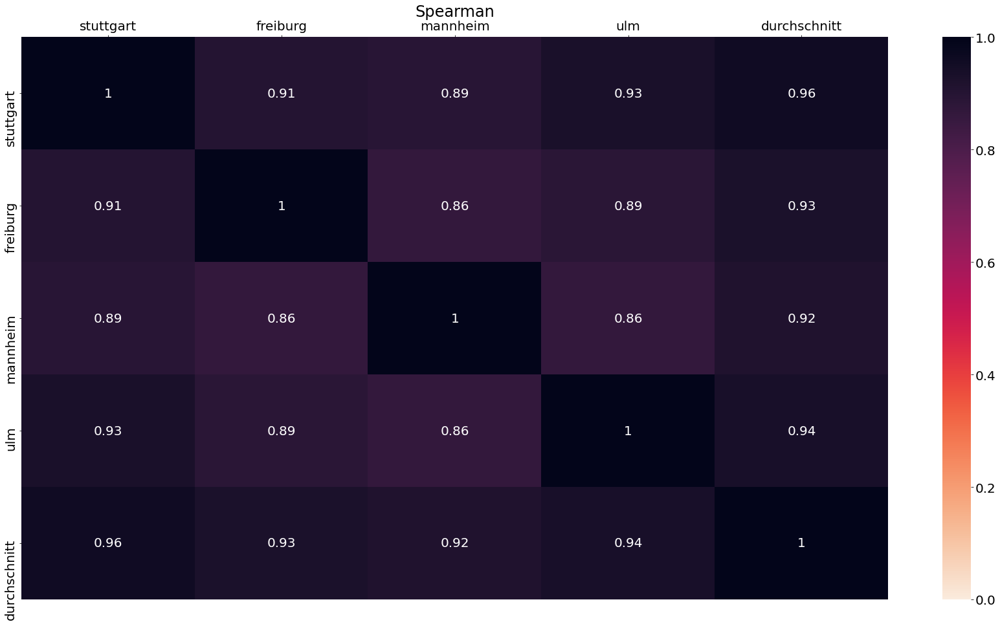

In [9]:
#Heatmap der Korrelationen untereinander (Pearson)
ax = sns.heatmap(data=df_hoechst.corr(method="pearson"), annot=True, vmin=0, vmax=1, cmap="rocket_r");
ax.set_title("Pearson")
ax.xaxis.set_ticks_position("top")

plt.show()

#Heatmap der Korrelationen untereinander (Spearman)
ax = sns.heatmap(data=df_hoechst.corr(method="spearman"), annot=True, vmin=0, vmax=1, cmap="rocket_r");
ax.set_title("Spearman")
ax.xaxis.set_ticks_position("top")

plt.show()

#Heatmap der Korrelationen untereinander (Kendall)
ax = sns.heatmap(data=df_hoechst.corr(method="kendall"), annot=True, vmin=0, vmax=1, cmap="rocket_r");
ax.set_title("Spearman")
ax.xaxis.set_ticks_position("top")

plt.show()

## <font size="6">Durchschnittstemperatur</font><a class="anchor" id="2-02a-durchschnitt"></a>

<font size="5">Wie schon bei der Tagestiefsttemperatur und Tageshöchsttemperatur ist auch der  Verlauf der Tagesdurchschnittstemperatur in allen Städten sehr ähnlich. In den Liniendiagrammen der einzelnen Jahre ist zu erkennen, dass sowohl die generelle Aufwärts- und Abwärtsbewegung sowie die feineres Ausschläge nach oben und unten fast gleich verlaufen.</font>

In [10]:
#Daten aus jeweiliger CSV-Datei laden
df_durchschnitt = pd.read_csv("Datenbeschaffung/kalender.csv", index_col=0, parse_dates=True, usecols=[0,2])
df_durchschnitt = df_durchschnitt.join(pd.read_csv("Datenbeschaffung/stuttgart.csv", index_col=0, parse_dates=True, usecols=[0,2], squeeze=True).rename("stuttgart"))
df_durchschnitt = df_durchschnitt.join(pd.read_csv("Datenbeschaffung/freiburg.csv", index_col=0, parse_dates=True, usecols=[0,2], squeeze=True).rename("freiburg"))
df_durchschnitt = df_durchschnitt.join(pd.read_csv("Datenbeschaffung/mannheim.csv", index_col=0, parse_dates=True, usecols=[0,2], squeeze=True).rename("mannheim"))
df_durchschnitt = df_durchschnitt.join(pd.read_csv("Datenbeschaffung/ulm.csv", index_col=0, parse_dates=True, usecols=[0,2], squeeze=True).rename("ulm"))

#Durchschnitt berechnen
df_durchschnitt["durchschnitt"] = round(((df_durchschnitt["stuttgart"] + df_durchschnitt["freiburg"] + df_durchschnitt["mannheim"] + df_durchschnitt["ulm"]) / 4), 1)

print(df_durchschnitt)

             wochentag  stuttgart  freiburg  mannheim   ulm  durchschnitt
datum                                                                    
2015-01-01  Donnerstag       -1.8      -3.0      -0.4  -4.9          -2.5
2015-01-02     Freitag        0.9      -1.3       0.5  -0.1          -0.0
2015-01-03     Samstag        1.4       1.7       1.3   0.4           1.2
2015-01-04     Sonntag       -0.5       0.1       1.3  -1.6          -0.2
2015-01-05      Montag        0.7      -0.4       0.1  -2.4          -0.5
...                ...        ...       ...       ...   ...           ...
2021-12-27      Montag        5.9       6.0       6.7   4.3           5.7
2021-12-28    Dienstag        8.3       9.2       9.7   5.8           8.2
2021-12-29    Mittwoch        8.4       9.6       9.4   7.5           8.7
2021-12-30  Donnerstag       11.2      11.2      12.3  10.4          11.3
2021-12-31     Freitag       10.7      10.2      12.6   9.3          10.7

[2557 rows x 6 columns]


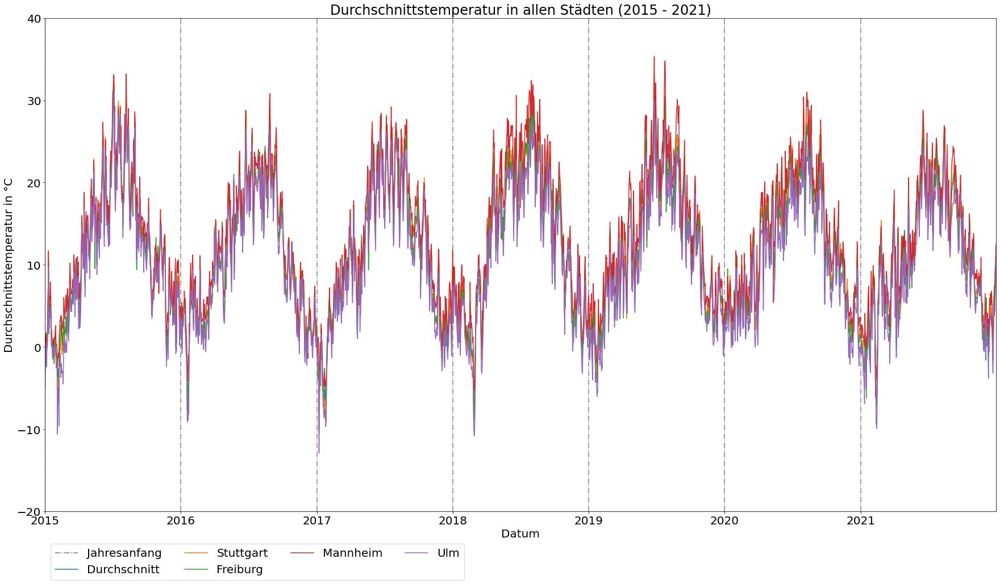



               count       mean       std   min  25%   50%   75%   max
stuttgart     2557.0  11.725068  7.922248 -10.5  5.3  11.2  18.0  32.1
freiburg      2557.0  11.649042  7.818679  -9.4  5.2  11.2  17.9  31.3
mannheim      2557.0  13.223817  8.027229  -7.1  6.6  12.7  19.6  35.3
ulm           2557.0  10.227454  7.761637 -12.9  4.0   9.9  16.5  31.1
durchschnitt  2557.0  11.706492  7.845246 -10.0  5.2  11.2  18.0  32.1




In [11]:
#Jahre einzeichnen
functions.draw_years(df_durchschnitt)

#Daten für jede Stadt und Durchschnitt plotten
plt.plot(df_durchschnitt["durchschnitt"], label="Durchschnitt")
plt.plot(df_durchschnitt["stuttgart"], label="Stuttgart");
plt.plot(df_durchschnitt["freiburg"], label="Freiburg");
plt.plot(df_durchschnitt["mannheim"], label="Mannheim");
plt.plot(df_durchschnitt["ulm"], label="Ulm");

#Achsen und Layout
plt.title("Durchschnittstemperatur in allen Städten (2015 - 2021)")
plt.ylabel("Durchschnittstemperatur in °C")
plt.ylim(-20, 40)
plt.xlabel("Datum")
plt.xlim(dt.datetime(2015,1,1), dt.datetime(2021,12,31))

#Legende einfügen
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc="lower left", bbox_to_anchor=(0,-0.15), ncol=4)

plt.show()

#Deskriptive Statistiken
print("\n")
print(df_durchschnitt.describe().transpose())
print("\n")



 2015 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




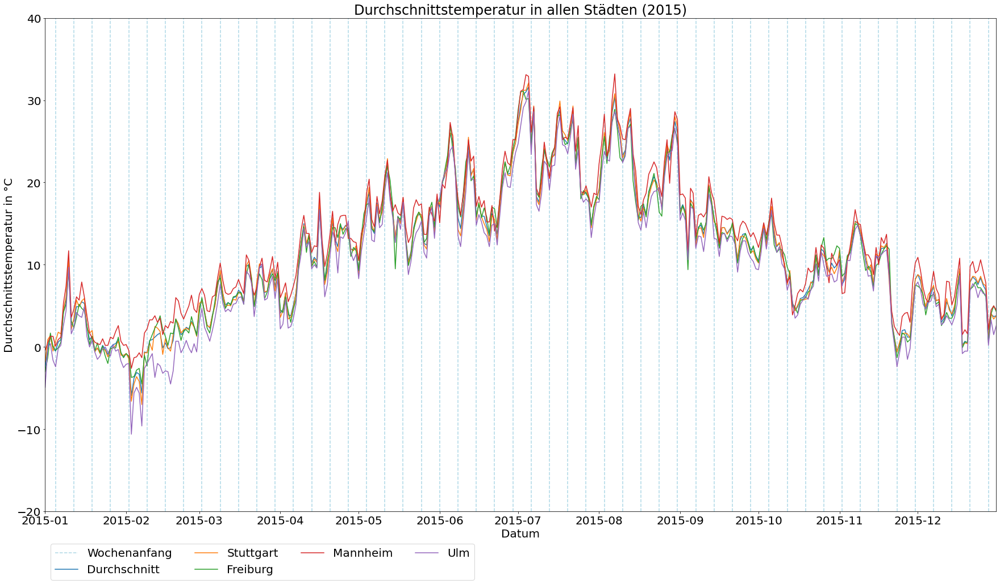



              count       mean       std   min  25%   50%   75%   max
stuttgart     365.0  11.569315  8.156127  -7.0  5.3  11.4  16.9  32.1
freiburg      365.0  11.479178  8.107459  -4.5  4.9  11.4  17.1  31.1
mannheim      365.0  12.727123  7.911332  -2.6  6.5  12.6  18.1  33.2
ulm           365.0  10.466301  8.309745 -10.6  4.2  10.5  15.9  31.1
durchschnitt  365.0  11.562466  8.089954  -5.9  5.1  11.6  17.0  31.6




 2016 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




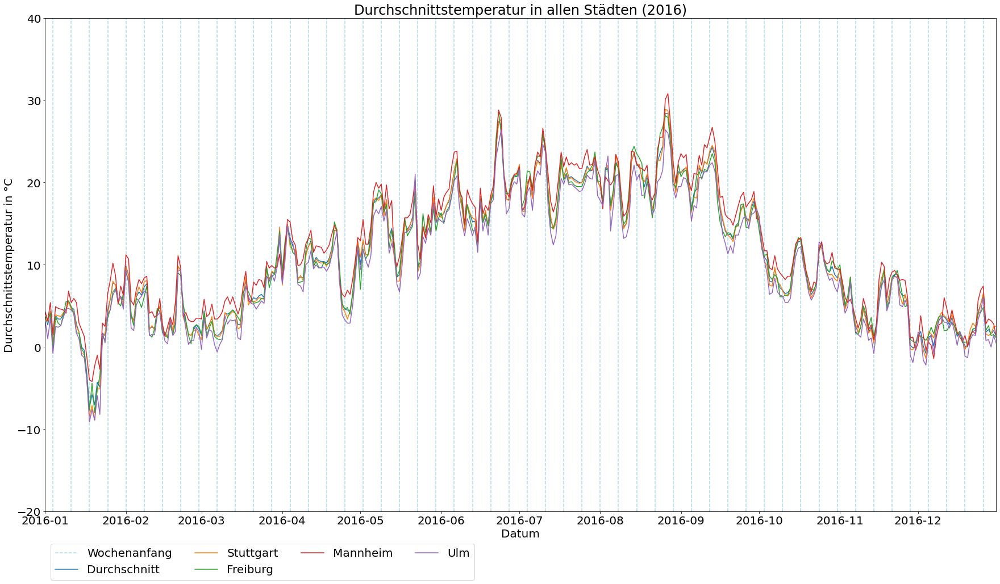



              count       mean       std  min    25%    50%     75%   max
stuttgart     366.0  10.806831  7.669226 -8.9  4.200   9.80  17.300  28.9
freiburg      366.0  10.776776  7.626711 -8.0  4.100   9.80  17.300  28.7
mannheim      366.0  11.969126  7.647114 -4.2  5.400  11.05  18.625  30.8
ulm           366.0   9.879235  7.489138 -9.1  3.425   9.10  16.200  26.4
durchschnitt  366.0  10.857650  7.576957 -7.3  4.225   9.80  17.300  28.4




 2017 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




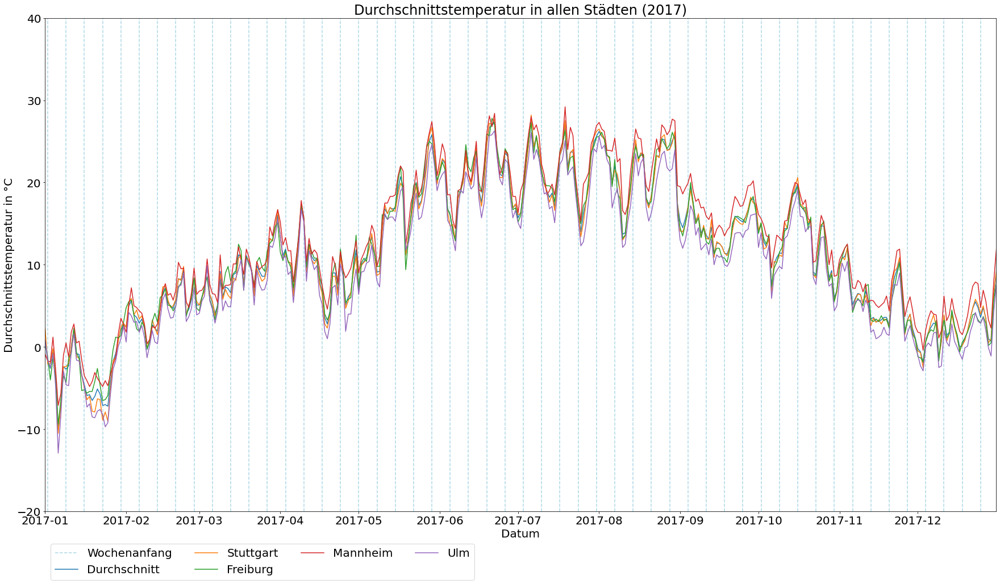



              count       mean       std   min  25%   50%   75%   max
stuttgart     365.0  11.216164  8.466806 -10.5  4.9  10.9  17.5  28.2
freiburg      365.0  11.363562  8.408905  -9.4  4.7  11.2  17.8  27.8
mannheim      365.0  12.728767  8.369205  -7.1  6.4  12.4  19.2  29.2
ulm           365.0   9.980548  8.312269 -12.9  3.6  10.0  16.2  26.3
durchschnitt  365.0  11.320274  8.361859 -10.0  5.0  11.1  17.7  27.4




 2018 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




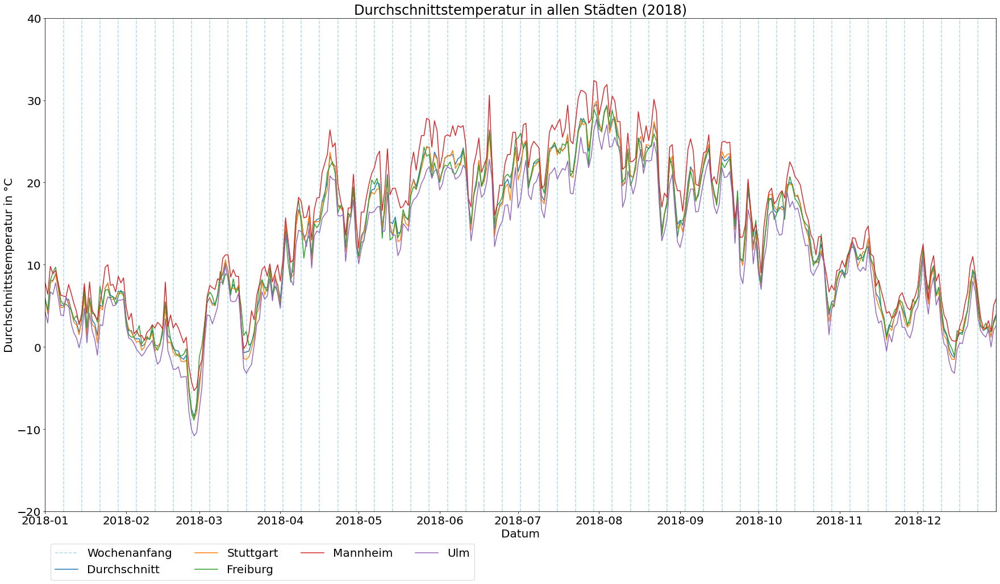



              count       mean       std   min  25%   50%   75%   max
stuttgart     365.0  12.798356  8.699959  -8.7  5.5  13.5  20.1  29.9
freiburg      365.0  13.005479  8.419651  -8.9  5.8  13.3  20.6  29.2
mannheim      365.0  14.876438  9.027117  -5.3  7.2  15.7  22.6  32.4
ulm           365.0  11.227123  8.398309 -10.8  4.1  12.3  18.2  27.7
durchschnitt  365.0  12.978356  8.607239  -8.4  5.7  14.0  20.3  29.5




 2019 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




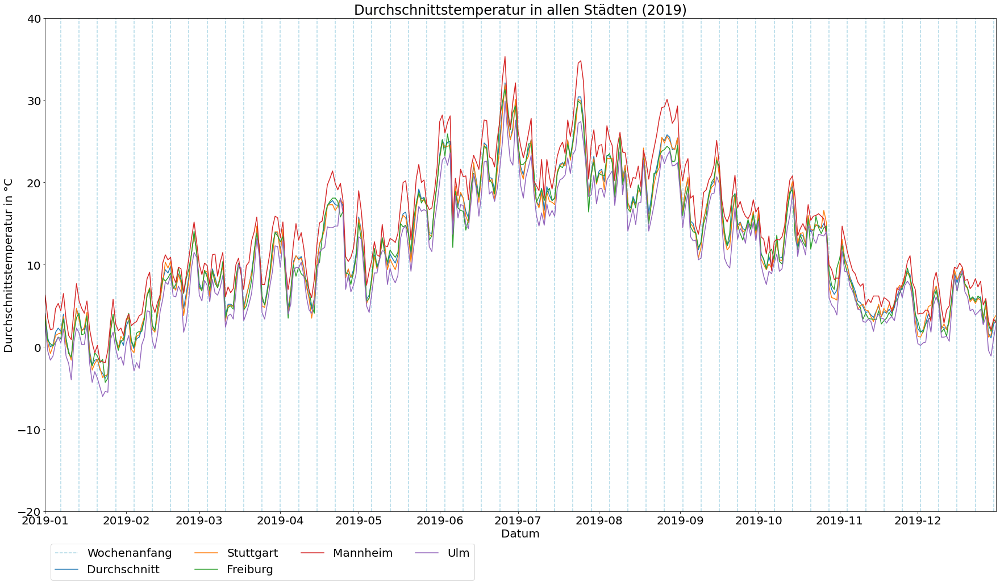



              count       mean       std  min  25%   50%   75%   max
stuttgart     365.0  12.030959  7.661894 -3.7  5.8  10.9  17.7  31.9
freiburg      365.0  12.030959  7.674401 -4.3  5.9  11.4  18.1  31.3
mannheim      365.0  14.236986  8.088757 -1.9  7.6  13.3  20.5  35.3
ulm           365.0  10.538630  7.543891 -6.0  4.4   9.7  16.5  29.9
durchschnitt  365.0  12.210137  7.706924 -3.8  6.0  11.4  18.2  32.1




 2020 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




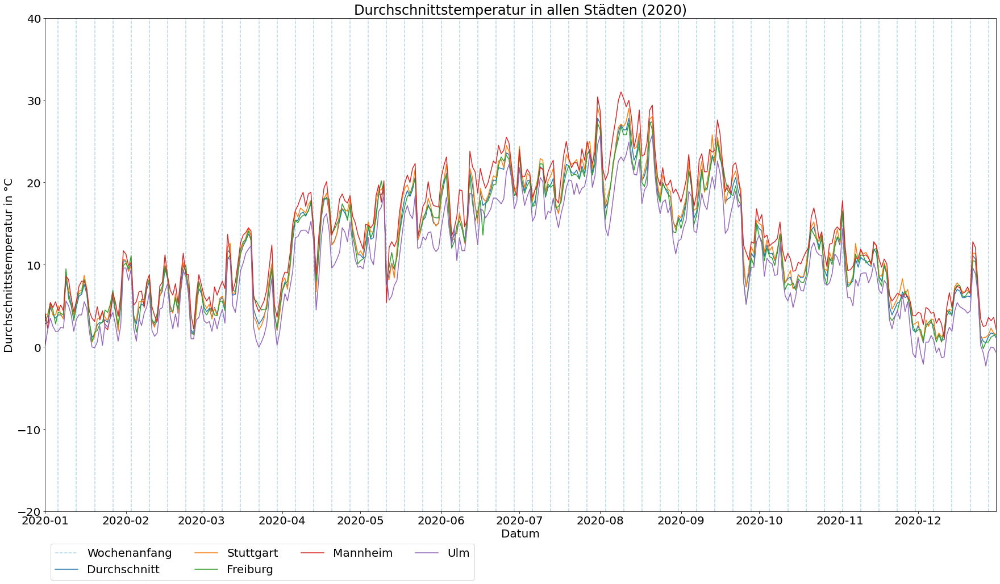



              count       mean       std  min    25%    50%     75%   max
stuttgart     366.0  12.748907  7.150261  0.6  6.700  12.55  18.800  29.1
freiburg      366.0  12.207923  6.860865 -0.2  6.275  11.80  17.800  27.4
mannheim      366.0  13.847541  7.269575  1.0  7.125  13.30  19.850  31.0
ulm           366.0  10.315847  6.771145 -2.3  4.400   9.95  16.175  25.8
durchschnitt  366.0  12.279235  6.976945  0.5  6.200  11.70  18.175  27.8




 2021 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




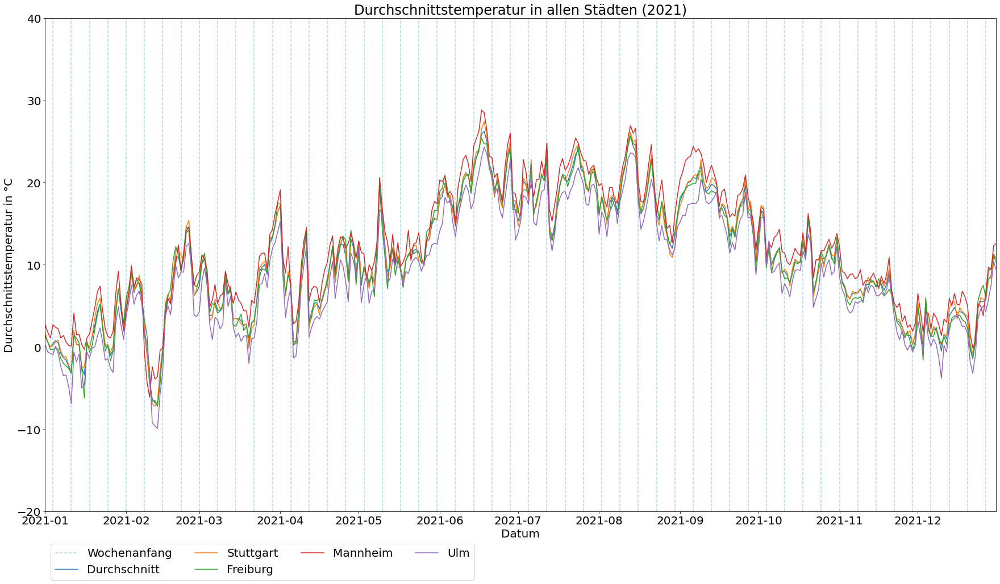



              count       mean       std  min  25%   50%   75%   max
stuttgart     365.0  10.904658  7.331807 -7.2  5.5  10.5  17.2  27.4
freiburg      365.0  10.680274  7.306771 -7.2  5.4  10.3  17.1  25.7
mannheim      365.0  12.182466  7.346287 -6.1  6.5  11.5  18.5  28.8
ulm           365.0   9.185205  7.265351 -9.9  3.6   9.1  15.3  24.3
durchschnitt  365.0  10.738082  7.274451 -6.8  5.0  10.3  16.8  26.2




In [12]:
for year in [2015, 2016, 2017, 2018, 2019, 2020, 2021]:
    
    print("\n\n", str(year), "--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------\n\n")
    
    #Untere und obere Grenze zum Filtern des DataFrames nach jeweiligem Jahr
    lower_border = str(year) + "-01-01"
    upper_border = str(year) + "-12-31"
    
    #Wochen einzeichnen
    functions.draw_weeks(df_durchschnitt[lower_border:upper_border])
    
    #Daten für jede Stadt und Durchschnitt plotten
    plt.plot(df_durchschnitt[lower_border:upper_border]["durchschnitt"], label="Durchschnitt")
    plt.plot(df_durchschnitt[lower_border:upper_border]["stuttgart"], label="Stuttgart");
    plt.plot(df_durchschnitt[lower_border:upper_border]["freiburg"], label="Freiburg");
    plt.plot(df_durchschnitt[lower_border:upper_border]["mannheim"], label="Mannheim");
    plt.plot(df_durchschnitt[lower_border:upper_border]["ulm"], label="Ulm");
    
    #Achsen und Layout
    plt.title("Durchschnittstemperatur in allen Städten (" + str(year) + ")")
    plt.ylabel("Durchschnittstemperatur in °C")
    plt.ylim(-20, 40)
    plt.xlabel("Datum")
    plt.xlim(dt.datetime(year,1,1), dt.datetime(year,12,31))
    
    #Legende einfügen
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = OrderedDict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), loc="lower left", bbox_to_anchor=(0,-0.15), ncol=4)

    plt.show()
    
    #Deskriptive Statistiken
    print("\n")
    print(df_durchschnitt[lower_border:upper_border].describe().transpose())
    print("\n")

<font size="5">Die Berechnung der Korrelation zeigt auch hier, dass die Werte fast perfekt untereinander sowie mit dem Durchschnitt korrelieren. Aus diesem Grund wird fortan nur der einfache Durchschnitt über alle Städte verwendet.</font>

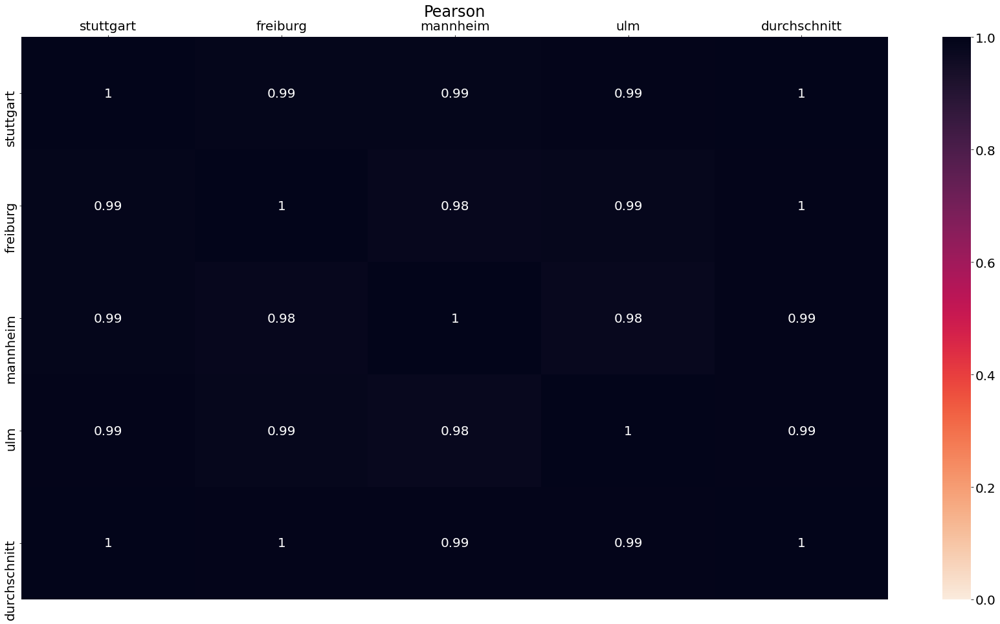

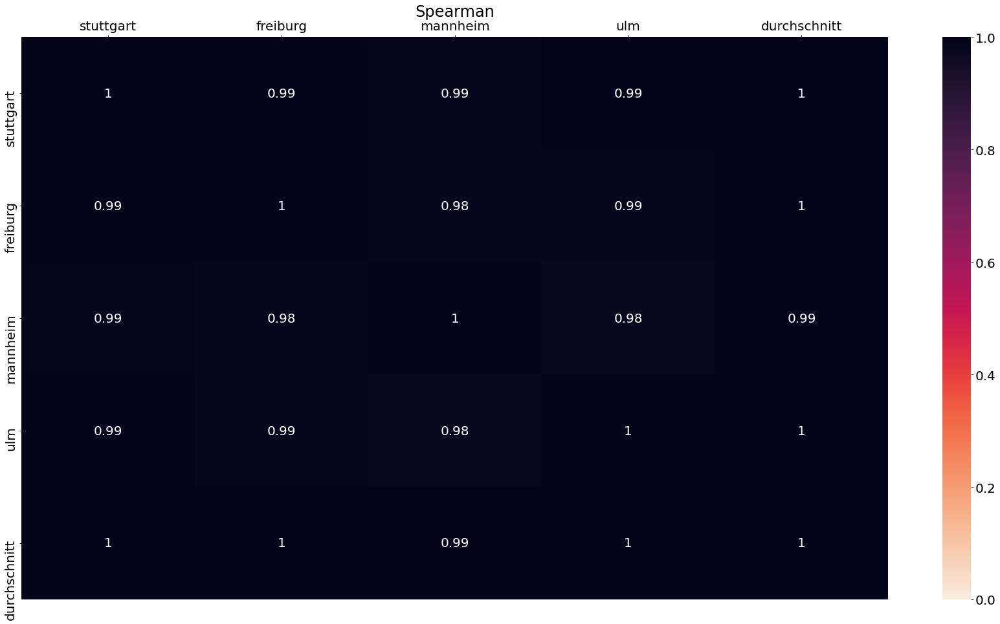

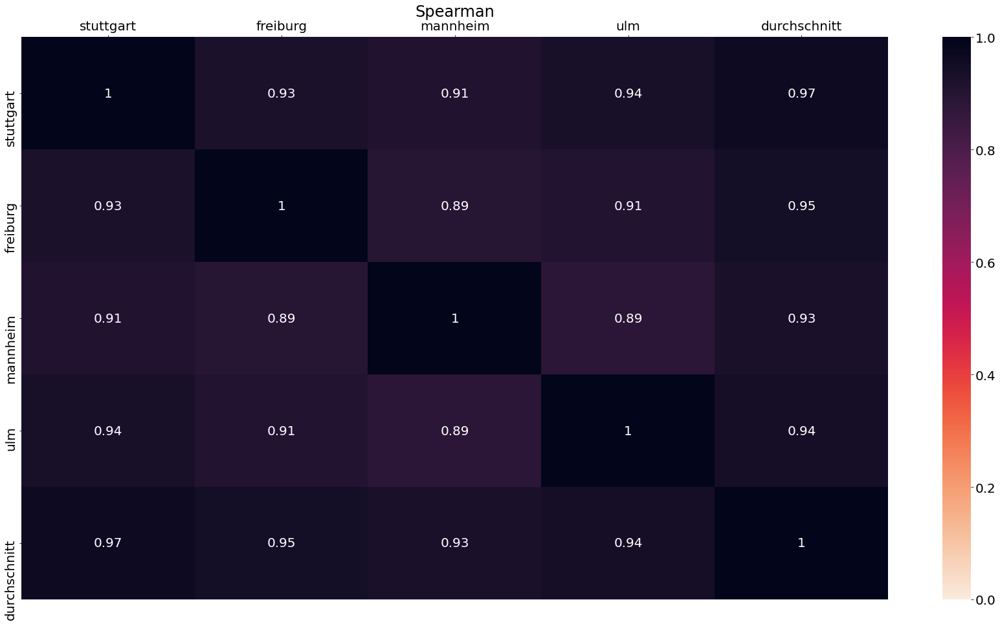

In [13]:
#Heatmap der Korrelationen untereinander
ax = sns.heatmap(data=df_durchschnitt.corr(method="pearson"), annot=True, vmin=0, vmax=1, cmap="rocket_r");
ax.set_title("Pearson")
ax.xaxis.set_ticks_position("top")

plt.show()

#Heatmap der Korrelationen untereinander
ax = sns.heatmap(data=df_durchschnitt.corr(method="spearman"), annot=True, vmin=0, vmax=1, cmap="rocket_r");
ax.set_title("Spearman")
ax.xaxis.set_ticks_position("top")

plt.show()

#Heatmap der Korrelationen untereinander
ax = sns.heatmap(data=df_durchschnitt.corr(method="kendall"), annot=True, vmin=0, vmax=1, cmap="rocket_r");
ax.set_title("Kendall")
ax.xaxis.set_ticks_position("top")

plt.show()

# <font size="7">Vergleich der Durchschnittswerte</font><a class="anchor" id="2-02a-vergleich"></a>

In [14]:
df = pd.read_csv("Datenbeschaffung/kalender.csv", index_col=0, parse_dates=True, usecols=[0,2])
df["tiefst"] = df_tiefst["durchschnitt"]
df["durchschnitt"] = df_durchschnitt["durchschnitt"]
df["hoechst"] = df_hoechst["durchschnitt"]

print(df)

             wochentag  tiefst  durchschnitt  hoechst
datum                                                
2015-01-01  Donnerstag    -5.8          -2.5      1.6
2015-01-02     Freitag    -4.0          -0.0      1.6
2015-01-03     Samstag    -3.1           1.2      3.2
2015-01-04     Sonntag    -3.5          -0.2      2.1
2015-01-05      Montag    -4.0          -0.5      3.4
...                ...     ...           ...      ...
2021-12-27      Montag     3.6           5.7      7.3
2021-12-28    Dienstag     5.5           8.2      9.7
2021-12-29    Mittwoch     6.8           8.7     12.1
2021-12-30  Donnerstag     9.8          11.3     12.8
2021-12-31     Freitag     7.5          10.7     14.2

[2557 rows x 4 columns]


<font size="5">Zuletzt werden die Durchschnitte der Tageshöchst-, Tagestiefst- und Tagesdurchschnittstemperatur verglichen. Es zeigt sich dabei, dass sich die Werte stets sehr ähnlich und gleichermaßen nach oben oder unten bewegen. Es sind keine größeren Abweichungen untereinander erkennbar. Allerdings liegt die Tagesdurchschnittstemperatur sehr viel näher an der Tageshöchsttemperatur als an der Tagestiefsttemperatur.</font>

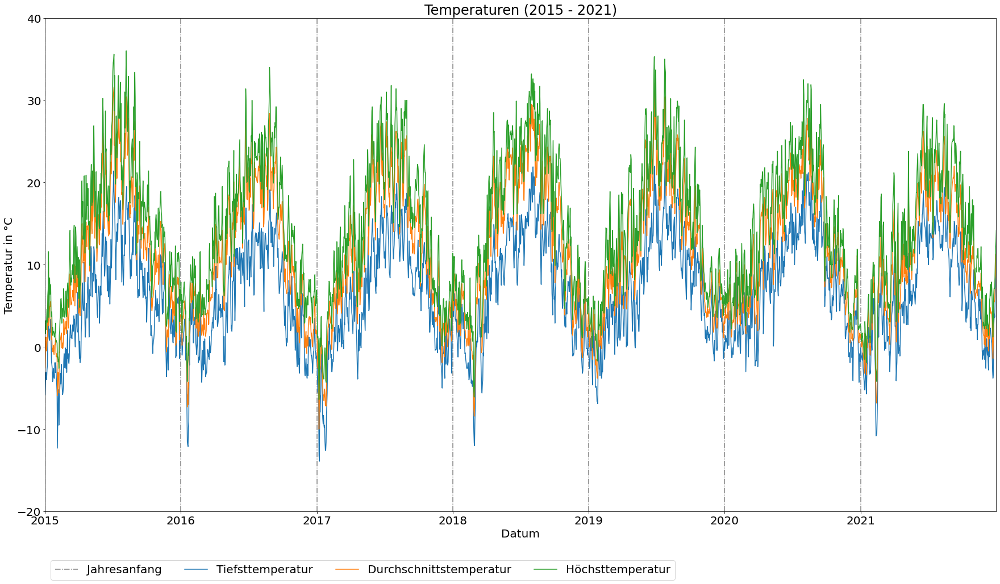



               count       mean       std   min  25%   50%   75%   max
tiefst        2557.0   6.409073  6.370920 -13.9  1.4   6.2  11.5  22.5
durchschnitt  2557.0  11.706492  7.845246 -10.0  5.2  11.2  18.0  32.1
hoechst       2557.0  14.614470  8.289005  -6.4  7.7  14.4  21.2  36.0




In [15]:
#Jahre einzeichnen
functions.draw_years(df)

#Daten plotten
plt.plot(df["tiefst"], label="Tiefsttemperatur")
plt.plot(df["durchschnitt"], label="Durchschnittstemperatur");
plt.plot(df["hoechst"], label="Höchsttemperatur");

#Achsen und Layout
plt.title("Temperaturen (2015 - 2021)")
plt.ylabel("Temperatur in °C")
plt.ylim(-20, 40)
plt.xlabel("Datum")
plt.xlim(dt.datetime(2015,1,1), dt.datetime(2021,12,31))

#Legende einfügen
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc="lower left", bbox_to_anchor=(0,-0.15), ncol=4)

plt.show()

#Deskriptive Statistiken
print("\n")
print(df.describe().transpose())
print("\n")



 2015 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




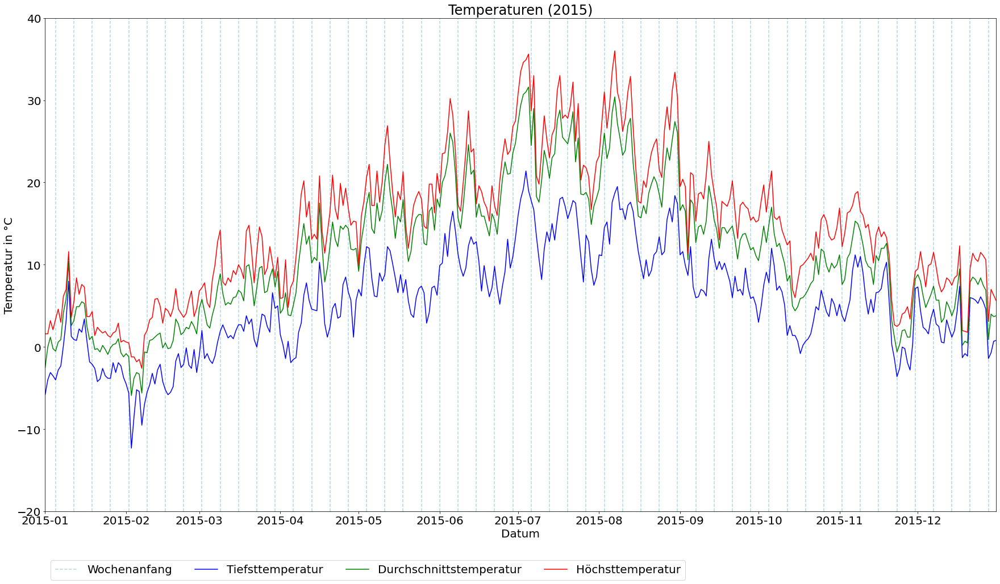



              count       mean       std   min  25%   50%   75%   max
tiefst        365.0   5.604110  6.231333 -12.3  1.0   5.8   9.9  21.4
durchschnitt  365.0  11.562466  8.089954  -5.9  5.1  11.6  17.0  31.6
hoechst       365.0  14.691781  8.532365  -2.6  7.9  14.7  20.2  36.0




 2016 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




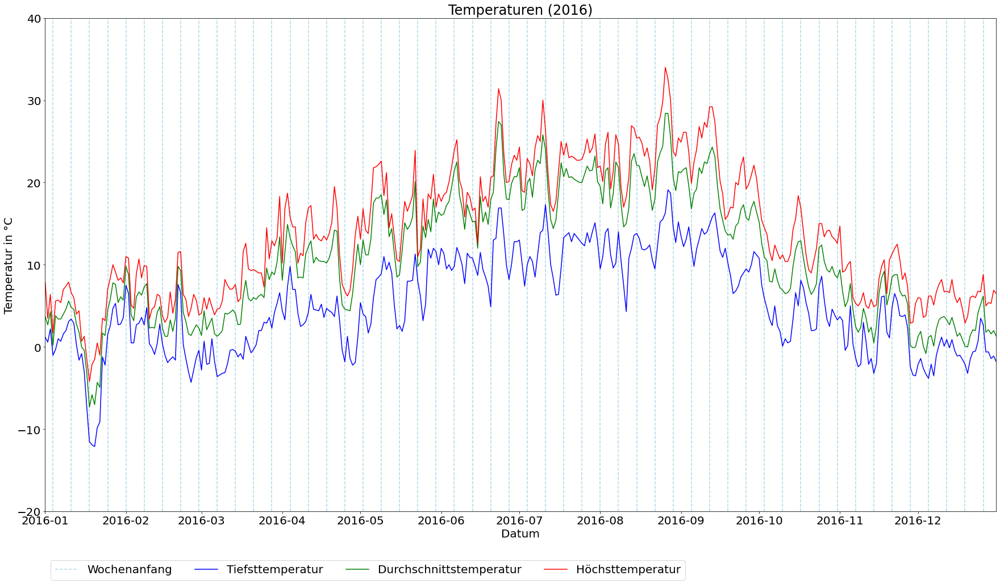



              count       mean       std   min    25%   50%     75%   max
tiefst        366.0   5.193716  5.916023 -12.1  0.400   4.4  10.175  19.1
durchschnitt  366.0  10.857650  7.576957  -7.3  4.225   9.8  17.300  28.4
hoechst       366.0  13.908470  7.752543  -4.2  6.800  13.1  20.175  34.0




 2017 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




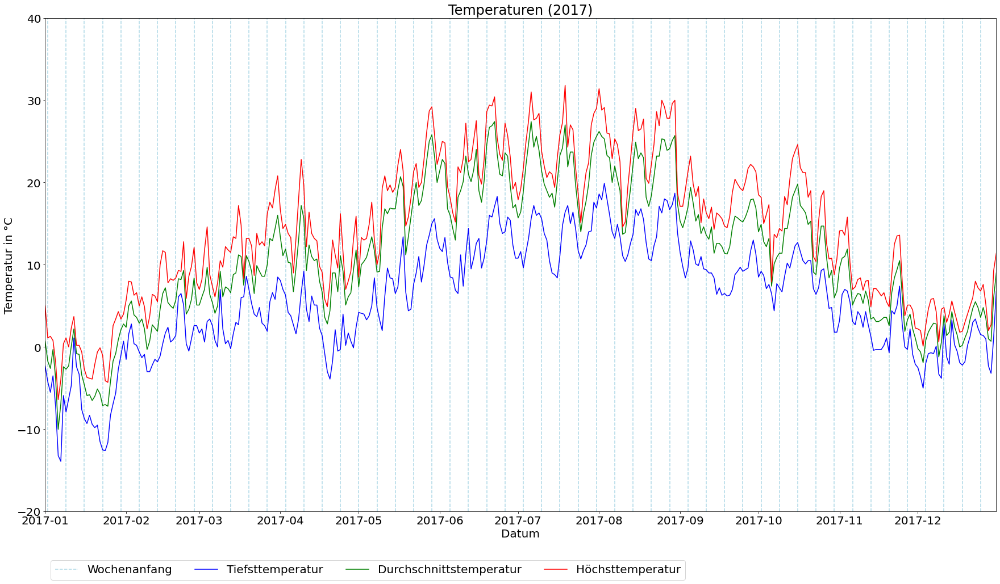



              count       mean       std   min  25%   50%   75%   max
tiefst        365.0   5.708767  6.829773 -13.9  0.9   6.2  10.8  19.9
durchschnitt  365.0  11.320274  8.361859 -10.0  5.0  11.1  17.7  27.4
hoechst       365.0  14.302466  8.664289  -6.4  7.4  14.4  21.2  31.8




 2018 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




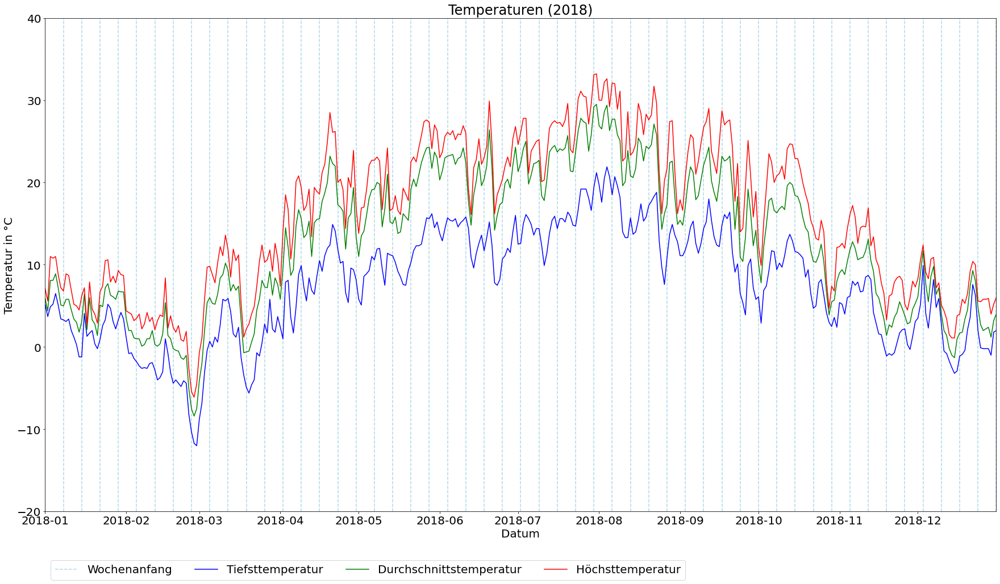



              count       mean       std   min  25%   50%   75%   max
tiefst        365.0   7.438082  6.791325 -12.0  2.1   7.9  12.9  21.9
durchschnitt  365.0  12.978356  8.607239  -8.4  5.7  14.0  20.3  29.5
hoechst       365.0  16.031233  9.068219  -6.1  7.9  16.7  23.8  33.2




 2019 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




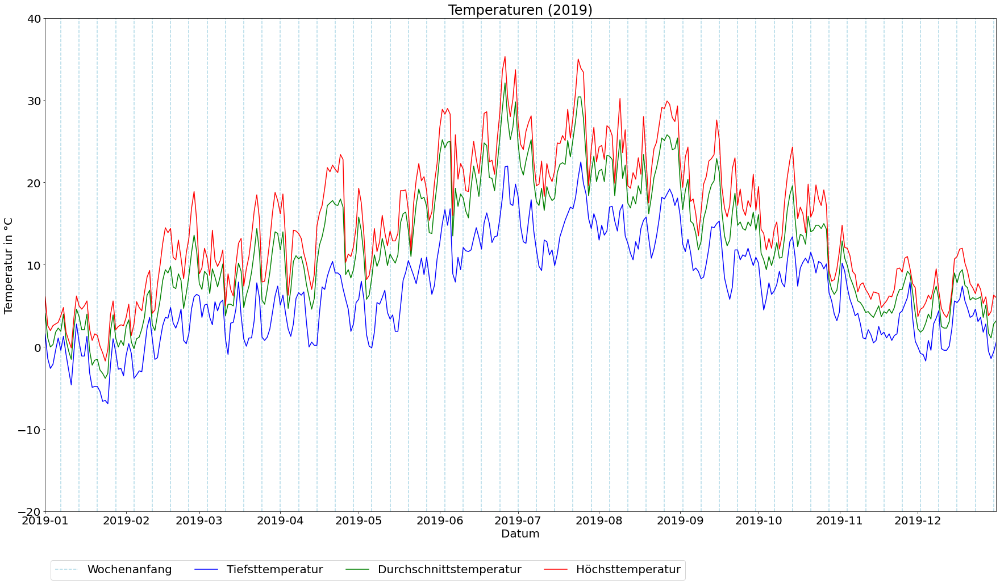



              count       mean       std  min  25%   50%   75%   max
tiefst        365.0   7.005479  6.189221 -6.9  1.9   6.4  11.8  22.5
durchschnitt  365.0  12.210137  7.706924 -3.8  6.0  11.4  18.2  32.1
hoechst       365.0  15.042740  8.238877 -1.7  8.0  14.4  21.4  35.3




 2020 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




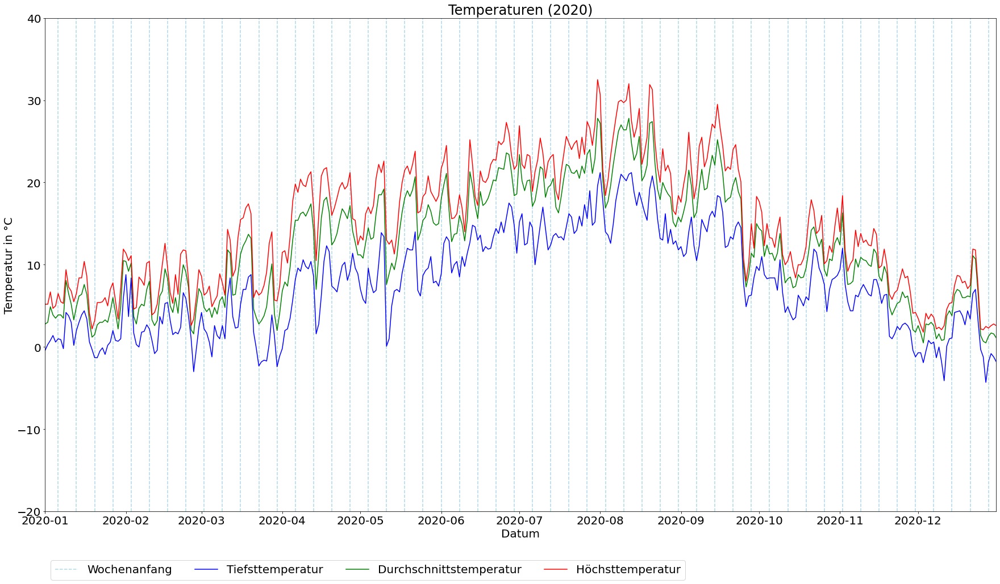



              count       mean       std  min   25%   50%     75%   max
tiefst        366.0   7.698087  5.987551 -4.3  2.40   7.5  12.475  21.2
durchschnitt  366.0  12.279235  6.976945  0.5  6.20  11.7  18.175  27.8
hoechst       366.0  14.836339  7.581308  1.8  8.25  14.3  21.400  32.5




 2021 --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------




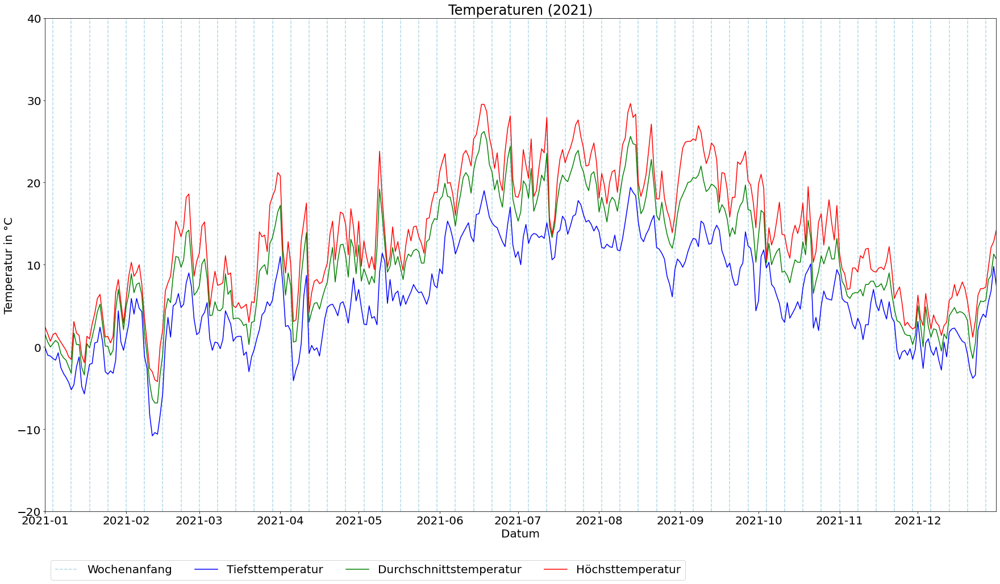



              count       mean       std   min  25%   50%   75%   max
tiefst        365.0   6.215068  6.189522 -10.8  1.3   5.5  11.8  19.4
durchschnitt  365.0  10.738082  7.274451  -6.8  5.0  10.3  16.8  26.2
hoechst       365.0  13.489589  7.903129  -4.2  7.3  13.4  19.9  29.6




In [18]:
for year in [2015, 2016, 2017, 2018, 2019, 2020, 2021]:
    
    print("\n\n", str(year), "--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------\n\n")
    
    #Untere und obere Grenze zum Filtern des DataFrames nach jeweiligem Jahr
    lower_border = str(year) + "-01-01"
    upper_border = str(year) + "-12-31"
    
    #Wochen einzeichnen
    functions.draw_weeks(df[lower_border:upper_border])
    
    #Daten für jede Stadt und Durchschnitt plotten
    plt.plot(df[lower_border:upper_border]["tiefst"], color="blue", label="Tiefsttemperatur")
    plt.plot(df[lower_border:upper_border]["durchschnitt"], color="green", label="Durchschnittstemperatur");
    plt.plot(df[lower_border:upper_border]["hoechst"], color="red", label="Höchsttemperatur");
    
    #Achsen und Layout
    plt.title("Temperaturen (" + str(year) + ")")
    plt.ylabel("Temperatur in °C")
    plt.ylim(-20, 40)
    plt.xlabel("Datum")
    plt.xlim(dt.datetime(year,1,1), dt.datetime(year,12,31))
    
    #Legende einfügen
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = OrderedDict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), loc="lower left", bbox_to_anchor=(0,-0.15), ncol=4)

    plt.show()
    
    #Deskriptive Statistiken
    print("\n")
    print(df[lower_border:upper_border].iloc[:,1:6].describe().transpose())
    print("\n")

<font size="5">Beim Berechnen der Korrelationskoeffizienten für die drei Merkmale lässt sich auch hier erkennen, dass die Werte sehr stark und einander korreliert sind. Die Tageshöchst- und Tagestiefsttemperatur korrelieren fast perfekt mit der Tagesdurchschnittstemperatur. Daher wird im Folgenden für die weiteren Analysen nur noch die Tagesdurchschnittstemperatur (beziehungsweise der Durchschnitt über alle vier Städte) verwendet, da die anderen beiden Merkmale keine zusätzlichen Informationen liefern.</font>

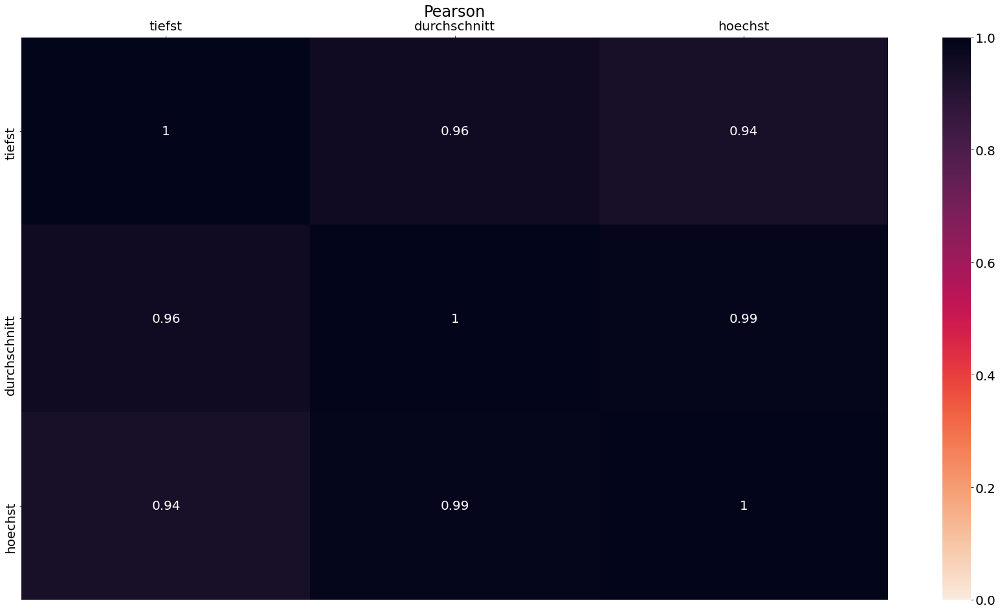

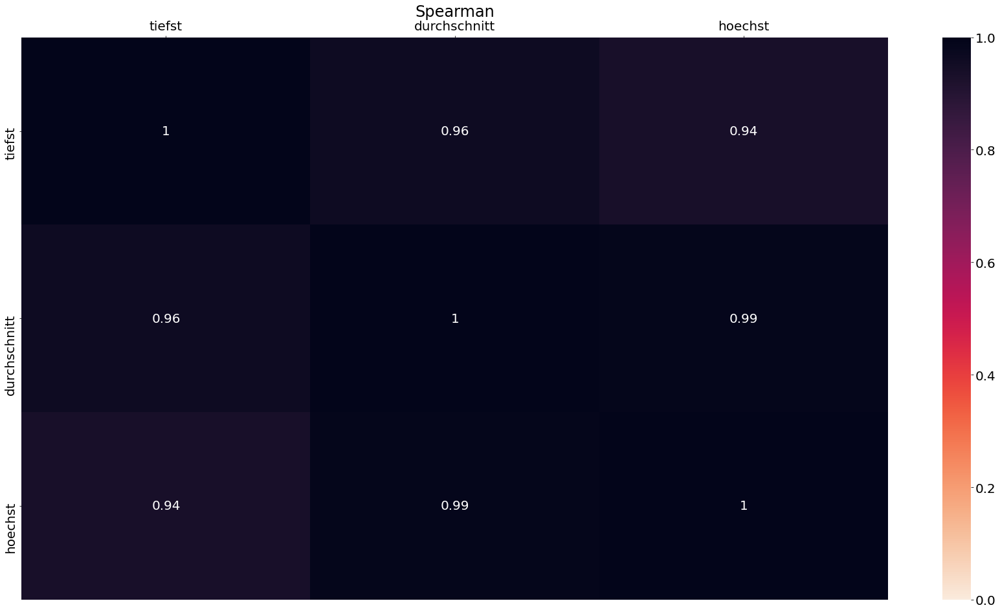

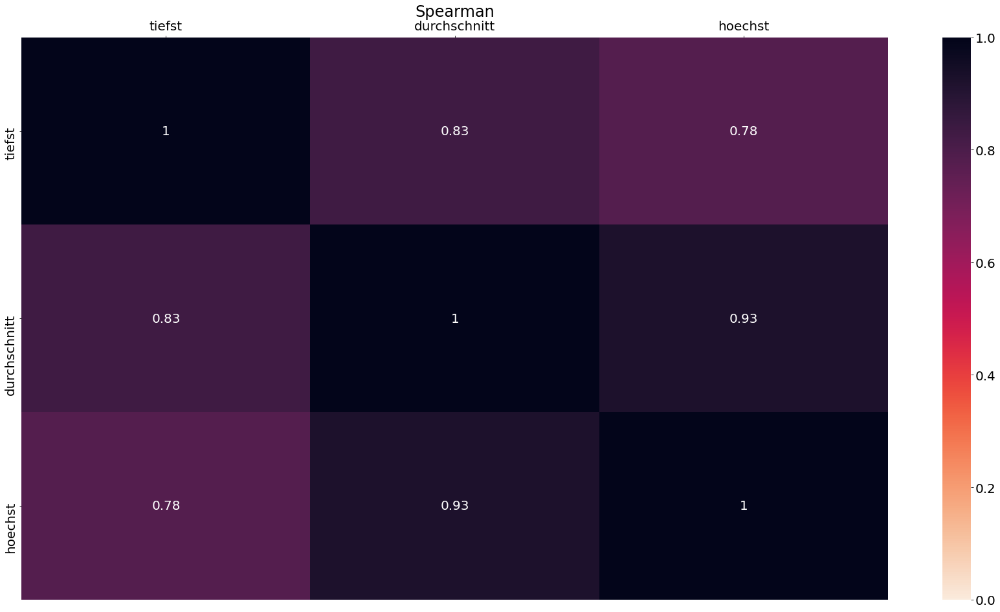

In [17]:
#Heatmap der Korrelationen untereinander
ax = sns.heatmap(data=df.corr(method="pearson"), annot=True, vmin=0, vmax=1, cmap="rocket_r");
ax.set_title("Pearson")
ax.xaxis.set_ticks_position("top")

plt.show()

#Heatmap der Korrelationen untereinander
ax = sns.heatmap(data=df.corr(method="spearman"), annot=True, vmin=0, vmax=1, cmap="rocket_r");
ax.set_title("Spearman")
ax.xaxis.set_ticks_position("top")

plt.show()

#Heatmap der Korrelationen untereinander
ax = sns.heatmap(data=df.corr(method="kendall"), annot=True, vmin=0, vmax=1, cmap="rocket_r");
ax.set_title("Kendall")
ax.xaxis.set_ticks_position("top")

plt.show()

# <font size="7">Fazit</font>
<font size="5">Da die Temperaturen in allen Städten fasst perfekt miteinander korrelieren und sich synchron bewegen, wird im folgenden nur noch der Durchschnitt der Tagesdurchschnittstemperatur über alle vier Städte verwendet.</font>